In [ ]:
import pandas as pd
import seaborn as sns
from ast import literal_eval
from sklearn.utils import resample
import statsmodels.formula.api as smf
from sklearn.metrics import f1_score, confusion_matrix

In [155]:
df = pd.read_csv('cache/data.csv', sep=',', index_col=0, dtype={
    'title': str,
    'release_date': str,
    'box_office_revenue': float,
    'runtime': float,
    'language': str,
    'countries': str,
    'genres': str,
    'movie_identifier': str,
    'actor_gender': str,
    'actor_height': float,
    'actor_ethnicity': str,
    'actor_name': str,
    'actor_age': float,
    'parsed_actor_name': str,
    'actor_identifier': str,
    'identifier': str,
    'category': str,
    'winner': str,
    'oscar_nominated': bool,
    'year': float,
    'has_rating': bool,
    'average_rating': float,
    'number_of_votes': float 

},
parse_dates=['release_date'])

# Data processing
df['winner'] = df['winner'].fillna('False').map({'True': True, 'False': False})

df['genres'] = df['genres'].apply(literal_eval)
df['countries'] = df['countries'].apply(literal_eval)
df['languages'] = df['languages'].apply(literal_eval)

# One-hot encoding

This was not used later

In [156]:
# Genres
exploded_df = df.explode('genres')
genres = exploded_df['genres'].unique()
pivot_df = exploded_df.pivot_table(index='identifier', columns='genres', aggfunc='size', fill_value=0).reset_index()
one_hot_df = df.merge(pivot_df, on='identifier', how='inner') 

# Countries
exploded_df = df.explode('countries')
countries = exploded_df['countries'].unique()
pivot_df = exploded_df.pivot_table(index='identifier', columns='countries', aggfunc='size', fill_value=0).reset_index()
one_hot_df = one_hot_df.merge(pivot_df, on='identifier', how='inner') 

# Languages
exploded_df = df.explode('languages')
languages = exploded_df['languages'].unique()
pivot_df = exploded_df.pivot_table(index='identifier', columns='languages', aggfunc='size', fill_value=0).reset_index()
one_hot_df = one_hot_df.merge(pivot_df, on='identifier', how='inner') 

# Analysis of laguage, genre, and country

In [238]:
exploded_df = df.explode('genres').astype(str)
exploded_df = exploded_df.explode('countries').astype(str)
exploded_df = exploded_df.explode('languages').astype(str)

In [169]:
language_df = exploded_df.groupby('languages').agg(mean=('oscar_nominated', 'mean'), std=('oscar_nominated', 'std')).sort_values(by='mean', ascending=False)
genre_df = exploded_df.groupby('genres').agg(mean=('oscar_nominated', 'mean'), std=('oscar_nominated', 'std')).sort_values(by='mean', ascending=False)
country = exploded_df.groupby('countries').agg(mean=('oscar_nominated', 'mean'), std=('oscar_nominated', 'std')).sort_values(by='mean', ascending=False)

# Logistic regression

## Preprocessing

We will use the exploded_df for training as it is easier to work with.

### Categorize features

In [240]:
continuous_features = [
    'box_office_revenue',
    'runtime',
    'year',
    'actor_age',
    'average_rating',
    'number_of_votes'
]
categorical_features = [
    'actor_gender',
    'actor_ethnicity',
    'has_rating'
]

### Normalize

In [ ]:
for feature in continuous_features:
    exploded_df[feature] = exploded_df[feature].fillna(df[feature].mean())
    exploded_df[feature] = (exploded_df[feature] - exploded_df[feature].mean()) / (df[feature].std() + 1e-6)

TypeError: Could not convert string '14010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.014010832.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.010161099.0nannannannannannannannannannannannannannannannan102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0102272727.0nannannannannan21521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.021521.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.029381649.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0932000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.034331783.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.011091868.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.03416846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.0172055.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.03960327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.017810894.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4736013.04736013.04736013.04736013.04736013.04736013.0nannannannannannannannannannan33300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.0nannannannannannannannannannannannannannannan638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0638181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4702575.04702575.04702575.04702575.04702575.04702575.04702575.04702575.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0529677.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.045000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0351447.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011130889.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.011148828.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.09524745.0nannannannannannannannannannannannannannan665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0665523.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0394589888.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.037311672.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.0nannannannannannannannannannannannannannannannannannannannannannannan10600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0127906624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0300218018.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.014598571.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.026255594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0152523164.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.09493259.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.044480039.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.032980880.0nannannannannannannannannannannannannannannannannan13996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.013996.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0869235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.02549834.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.010054150.0nannannannannannannannannannannannannannannannannannannannannannannan102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0102441078.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan106683817.0106683817.0106683817.0106683817.0106683817.0106683817.0106683817.0106683817.0106683817.0106683817.0nannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.010278549.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.09576495.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.026377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.017917697.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0160430.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0617632.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0110864.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100000.0100000.0100000.0100000.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.021570263.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.040443010.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.023032565.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.02868000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.013539154.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.04928000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.02153070.0nannannannannannannannannannannannannannannannannannannannannannan2473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.02473668.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.04430765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0114943631.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.076066841.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.02408311.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.05549200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0493214993.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.097169156.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1425000.01425000.01425000.01425000.01425000.01425000.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.023049593.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.03614835.0nannannannan30114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.030114487.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan429028.0429028.0429028.0429028.0429028.0429028.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.07399925.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannan717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0717376.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan4269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.04269426.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannan24964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.024964890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.035619521.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.082486154.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.085000000.0nannan89041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.089041656.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.01363000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0626057.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.018135531.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.017471727.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.0159000000.028100.028100.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan322871.0322871.0322871.0322871.0322871.0322871.0322871.0322871.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0136513833.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.07009668.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.046112640.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.037664855.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.02105000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0408000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.04028293.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87028.087028.087028.087028.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22501596.022501596.022501596.022501596.022501596.022501596.022501596.022501596.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0344992.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.08382938.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.016278590.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.010937893.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.09832166.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.0918239.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.06227998.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.06734962.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.0nannannannannannannannannannannannannannannannannannan13664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.013664060.0nannannannannannannannannan34700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.034700291.0nannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.091411255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.062450361.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.02176489.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.04636000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.04574762.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.03043000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.019281235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0151493655.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.019438638.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0267447150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.04096030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.0230685453.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.01598435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.03272028.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.0365727.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.071186502.0nannannannan38869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.038869464.0nannannannannannannannannannannannannannan320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0320145693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0259175788.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0110536.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0755774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.014249906.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.045479110.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannan43579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.043579163.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.033208099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.046264384.0nannannannannannannannannannannannannannannannannannannannannannannannannan12890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.012890752.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.010708890.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.04087361.0nannannan10058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.010058318.0nannannan24000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.028735315.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.017768757.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.016633035.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.013961370.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.02965315.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.01299985.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.020146880.0nannannannannannannannannannannannan83160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.083160734.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.0599595.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.05730596.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.030680.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.05450815.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.023947685.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.017014653.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.01324974.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.049797148.0nannannannannannannannannannannannannannannannannannannannannannan15351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.015351421.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.038077373.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.029133000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45000.045000.045000.045000.045000.045000.045000.045000.045000.045000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.010475705.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0744816.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.09164370.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0111231041.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.035450113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0554709226.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.06203044.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.037536.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.068369434.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.011864.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.015020293.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.065435625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14370197.014370197.014370197.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.06408791.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.09250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0168839459.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.0311922.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.014972297.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.07888703.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.035892330.0nan2875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.02875086.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.065716126.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0141069860.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.06609661.0nannannannannannannannan11642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.011642946.0nannan539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0539957.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan272617.0272617.0272617.0272617.0272617.0272617.0272617.0272617.0272617.0272617.0272617.0272617.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.053424681.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0345041.0nannan6856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.06856989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan229246.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.096456.0nannannannannannannannan83453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.083453539.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.02504320.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.010360553.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.02892582.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.020447000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0916472.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.09085049.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154642.0154642.0154642.0154642.0154642.0154642.0154642.0154642.0154642.0154642.0154642.0154642.0154642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.069485490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.010422387.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.06948633.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.01977544.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0790128.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.045500797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.013936909.0nannannannannannannannan2019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02019100.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.092180910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.026657534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.017193231.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.077713866.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0519596.0nannannannannannannannannannan213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.0213954274.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.097138686.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan618000.0618000.0618000.0618000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.038955598.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0623933331.0nannannannannannannannannannannannannannannannannannannan2550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.02492704.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.010878107.0nannannannannan79000.079000.079000.079000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.031651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0126216940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.025479558.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.060922980.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannan35000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.02625000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.0655802.06243557.06243557.06243557.06243557.06243557.06243557.06243557.06243557.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.096455697.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.03878993.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0102647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.011384.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0951801.0nannannannan23509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.023509382.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0195300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.018800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0164839294.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.016458459.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.060965854.0nannannannannannannannannannannannannannannannannannannannan2791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.02791515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.012484444.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.033526835.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.011307844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.086369815.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan959000.0959000.0959000.0959000.0959000.0959000.0959000.0959000.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0204940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0227799884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannan6770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.06770587.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100500.0100500.0100500.0100500.0100500.0100500.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.09840338.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.0898786.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.02819485.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.034585416.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.014391750.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.04092682.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.06375000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.044909486.0nannannannannannannannannannannannannannannannannan46060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.046060.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0886461.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1975000.01975000.01975000.0nannannannannannan3335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.03335984.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.09255027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.07319210.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.026960191.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0122823468.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.023278931.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.018297790.0nannannannannannannannannan5837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.05837674.0nannannan4875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.04875436.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2086905.02086905.02086905.02086905.02086905.02086905.02086905.02086905.02086905.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.057756408.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0821708551.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.036402320.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.0324138.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.039102650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.014237880.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6171057.06171057.06171057.06171057.06171057.06171057.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.033807409.0nannannannannan2694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.02694234.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.010902112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.014248749.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101327.0101327.0101327.0101327.0101327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.012232628.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.010309370.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.018012.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4845724.04845724.04845724.04845724.04845724.04845724.04845724.04845724.04845724.04845724.04845724.04845724.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.01231622.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1325000.01325000.01325000.01325000.01325000.01325000.01325000.01325000.01325000.01325000.01325000.01325000.01325000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.0157887643.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.010015449.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0336620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0448191819.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0120081841.0nannannannannannannannannannannannannannannannannannannannannannannannannan27002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.027002097.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.083915414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.083440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.06833354.0nannannannannannannannannannannannannannannannannan37591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.037591674.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2456417.02456417.02456417.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2621000.02621000.02621000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.0905291.01450000.01450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.03202000.0nannannannannannannannannannannannannannannannannannannannan7316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.07316658.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.024019048.0nannannannannannannannannannannannannannannannannannannannannannannannannannan80000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0749147.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.031181347.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.07356393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.068716.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.05568880.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0141220678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.08266778.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.029725663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0419428.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1004000.01004000.01004000.01004000.01004000.01004000.01004000.01004000.01004000.01004000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.07248490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0459824.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0461983149.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0149705852.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0618017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.010903312.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.02887285.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.027807627.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.04134992.0nannannannannannannannannannannan10490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.010490000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.0nannannannannannan50466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.050466747.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan960387.0960387.0960387.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1668661.01668661.01668661.01668661.01668661.01668661.01668661.01668661.01668661.01668661.01668661.01668661.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.047231070.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0115097286.0nannan53458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.053458319.0nannannan8224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.08224998.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.043700855.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0171627166.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.031753898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.096618699.0nannannannannannannannannannannannannannannannan10209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.010209111.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0187500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.048362207.0nannannannannannan295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0295683.0nannannannannannannannannannannannannannannannannannan5530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.05530764.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.071215869.0nannannan19853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.019853892.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.087528173.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0102001626.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0488697.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.0779137.07088077.07088077.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.03200241.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannan22000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.022000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.052096475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.050865589.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.06982680.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.023438120.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.013904766.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.020240502.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.01955933.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.016908947.0nannannannannannannannannannannannannannannannannannannannannan130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0130358911.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0239606210.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0124880.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0104384415.0nannan9800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.09800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.03017000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.02650356.0nannannannannannannannan3242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.03242342.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0330116.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.023809504.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4606199.04606199.04606199.04606199.04606199.04606199.0nannannannannannannannannannannannannannannannannannannannannan71646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.071646.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.04626050.0nannannannannannannannannannannannannannannannannannannannannannannannan116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0116353.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.019576023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0136123083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.01733000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0721108.0nannannannannannannannannannan119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0119723856.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0113069.0nannannannannan4064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04064495.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.017496992.09900000.09900000.09900000.09900000.09900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0282175.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan947741.0947741.0947741.0947741.0947741.0947741.0nannannannannannannannannannannannannannannannannannannannannannannannan1820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.01820049.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.020998.0nannannan4398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.04398938.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.06850853.0nan37105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.037105289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.046671235.0nan14821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.014821658.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan686703.0686703.0686703.0686703.0686703.0686703.0686703.0686703.0686703.0686703.0686703.0686703.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.030536013.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.095146283.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.015516.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40366.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0133982.0nannannannannannannannannannannannannannannannan76520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.076520000.0nannan17159458.017159458.017159458.017159458.017159458.017159458.017159458.017159458.017159458.017159458.017159458.017159458.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.04468000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.02260712.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.012885193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17730219.017730219.017730219.017730219.017730219.017730219.017730219.017730219.017730219.017730219.017730219.017730219.017730219.017730219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.05221281.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.07571115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.09747988.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0128406887.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0371295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.08055900.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.02136381.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0700000.0nannannannannannannannannannannannan91258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.091258000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0600200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.03547684.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0129190869.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.09639390.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.044527234.0nannannannan33882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.033882243.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.0237382724.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.041622502.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0146154.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.022852638.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.037170057.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20967660.020967660.020967660.020967660.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.044753475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0144216468.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.068282844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0638227.0nannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.020560255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.084093.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.01663867.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.018090181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan81600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.0177547352.0177547352.0177547352.0177547352.0177547352.0177547352.0177547352.0177547352.0177547352.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0132856738.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.03580000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.044703995.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0128905366.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0245676146.0nannannannannannannannannannannannannannan8891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.08891623.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.035319689.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.039947322.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.011208511.0nannannannannannannannannan23371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.023371905.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.05571205.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.04091378.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.083320000.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.053293628.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0233150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18027475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.06149983.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.07600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0125400.0nannannannannannannannannannannannannannannannannan343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0343786.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.025775.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan513176.0513176.0513176.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.033013805.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.023159305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.04205000.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.014350945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.05812781.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.05455736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.060864870.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19184820.019184820.019184820.019184820.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.0nannannan354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0354628.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.03532000.0nannannannannannannannannannannannannannannannannannannannannannan1500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.042538.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.02490011.0nannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannan84646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.084646831.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0659483.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.06171763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan74189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.074189677.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7856048.07856048.07856048.07856048.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0245375374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.043805.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0368100420.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0177059441.0nannannan4603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.04603929.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.06451106.02750000.02750000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.031000000.0nannannannannannannannannannannannannannannannannannan199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0199043242.0nannannannannannannannannannannannannannannannannannannannannan497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0497409852.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.073052428.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36412.036412.036412.036412.036412.036412.036412.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.010371998.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.065864741.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.048451803.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.015379253.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.0718490.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.023726793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.08145549.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.033426588.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.033296457.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0558342.0nannannannan1550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.020529194.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.08315806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan70124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.070124099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.08250145.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.056489558.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.029367143.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.022375000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.048919043.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0315005577.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0125000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.060378584.0nannannannannannannannannannannannannannan36039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.036039.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.022313201.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.023562716.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.06933459.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.057405220.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.04735000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.02581012.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.054000000.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.013019253.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0269586.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.02554476.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1110840.01110840.01110840.01110840.0nannannannannannannannannannannannannannannannannannannannannannan177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0177841558.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannan89000.089000.089000.089000.089000.089000.089000.089000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0310650585.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.015773351.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0528000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.067464.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.035419397.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0110879513.0nannannannannannannannannannannannannannannannan30017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.030017647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.02844379.01130270.01130270.01130270.01130270.01130270.01130270.01130270.01130270.01130270.01130270.01130270.01130270.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.014202899.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0101229792.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.01020695.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.014515490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.021693114.0nannannannannannan929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0929000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0218947037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0343818.0nannannannan47285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.047285152.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0136159423.0nannannannannannannannannannannannannannan1321000.01321000.01321000.01321000.01321000.01321000.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.063102666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.013195678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.014110589.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.013818181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.09723970.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0649398328.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.07434726.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.036853000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.060242305.0nannannannannannannannan154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0154026136.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0171082.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.03077604.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0216197492.0nannannannannannannannannannannannannannannannannannannan3000000.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.010848783.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0325265.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0352810.0nannannannannannannannannannannannannannannannan5145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.05145363.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.025966555.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.01166199.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0162966177.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.049805462.0nannannannannannannannan43493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.043493123.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.049782400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.010194274.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.012826323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.01132112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.0nannannannannannannannannannannannannannannannannannannannannan3337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.03337685.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.014051384.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.04131508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.02415593.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.036489888.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.017804565.0nannannannan8630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.08630068.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0113714830.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.02490000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0114660784.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.01105041.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.038748395.0nan65001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.065001485.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0368086.0nannannannannannannannan47383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.047383689.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.09941428.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.03650000.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.01078737.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0330579719.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.012528819.0902591.0902591.0902591.0902591.0902591.0902591.0902591.0902591.0902591.0902591.0902591.0902591.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.051718367.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.024477615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.03842129.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.044917151.0nannannannannannannannannannannannannannannannannannannannannannannan1550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannan43000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.0nannannannannannannannannannannannan54639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.054639553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0354825435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0970157.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0181490000.0nan18476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.018476.0nan1370000.01370000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.027484464.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.077741732.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.028000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.015453274.0nannannannannannannannannannannannannannannan89162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.089162162.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7006849.07006849.07006849.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.03817362.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0167805466.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0140000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.08533187.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.04903131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.077516304.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.058785180.0nannannannannannannannannannannannannannannannannannannannannannannannannannan6330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.06330054.0nannannan177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.0177977226.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.060427839.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.014961069.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.054579.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.049369899.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.01628579.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.05802422.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannan77982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.077982.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.08072007.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0307077300.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.040577001.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.017953778.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.04875000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.028744356.0nannannannannannannannannannannannannannannannannannannannan9495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.09495408.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.0nannannannannannannannannannan62000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.062000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.0307233.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.051881013.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.01963654.0nannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.01807506.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.010647219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.01346952.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0258771.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.034326249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.09837044.0nannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.018971000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.05855392.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.01572040.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0122563539.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0100086793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.09934679.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.09016782.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.015134168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.038400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.06166819.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.0113309743.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.01398424.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.011528900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.076669806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0415004880.0nannannannannannannannannannannannannannannannannannannannannannan703000.0703000.0703000.0703000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.04611062.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.01119112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.069787663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.04030793.0nannannan581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.0581055.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.03563162.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.014760451.0nannannannannannannannannannannannannannannannannannannannan5228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.05228617.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.096773200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000972.02000972.02000972.02000972.02000972.02000972.02000972.02000972.02000972.02000972.02000972.02000972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.039673162.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9230157.09230157.09230157.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0533569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0982795.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.050090.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0934416487.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.01109000.0nannannannannannannannannannannannan25023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.025023434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.012290017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.069631118.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.033543.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0142940100.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0123306987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0267005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1258000.01258000.01258000.01258000.01258000.01258000.01258000.01258000.01258000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.010393696.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.06136856.0nannannannannannannannannannannannannannannannannannannannan158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0158243.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0351583407.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.051880044.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.04695781.0nannan252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0252909177.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.019170001.0nannannannannannannannannannannannannannannannannan19463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.019463185.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.02034470.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3550487.03550487.03550487.03550487.03550487.03550487.0nannan100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0100020092.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2411145.02411145.02411145.02411145.02411145.02411145.02411145.02411145.02411145.02411145.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.09380029.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0463002.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.041700000.0nannannannannannannannannannannannannannannannannannan4872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.04872444.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.01516414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0353624124.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4667520.04667520.04667520.04667520.04667520.04667520.04667520.04667520.04667520.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan563000.0563000.0563000.0563000.0563000.0563000.0563000.0563000.0563000.0563000.0563000.0563000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0669276.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.076175166.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.020883046.0nannannannannannannannannannannannannannan1550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.049282156.0nannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1755134.01755134.01755134.01755134.01755134.01755134.01755134.01755134.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.031815.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan616000.0616000.0nannannannannannannannannannannan142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0142634358.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.034816824.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.05535405.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0138942405.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.0nannannannannannannannannannannannannannan10963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.010963824.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.065664721.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.06168898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.096047633.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.011833696.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0152159461.0nannannannannan3600000.03600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannan138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0138805831.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.02341309.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0150646.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.07237794.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.010148447.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.04710749.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0218613188.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.01754640.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.02248000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.01436308.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.037747016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.06562513.0nannannan1400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan262062199.0262062199.0262062199.0262062199.0262062199.0262062199.0262062199.0262062199.0262062199.0262062199.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.016799.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.039514713.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.034673100.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.01765545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.022026369.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14189860.014189860.014189860.014189860.014189860.014189860.014189860.014189860.014189860.014189860.014189860.0nannannan288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0288500217.0nan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.06880310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.030218387.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.010058121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.024922237.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.028733290.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91941891.091941891.091941891.091941891.091941891.091941891.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.018369.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.05756945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0104883.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2497233.02497233.02497233.02497233.02497233.02497233.02497233.02497233.02497233.02497233.02497233.02497233.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.086274793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.016643191.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.0275650703.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.08143225.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.02443000.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.010959475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0113996937.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.011798616.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0200804534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.05899797.0nannan13906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.013906394.01058979.01058979.01058979.01058979.01058979.01058979.0nannan15556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.015556340.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.015116634.0nannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannan3360000.03360000.03360000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2643251.02643251.02643251.02643251.02643251.02643251.02643251.02643251.02643251.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.014145677.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.033759266.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.038087756.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.0926047111.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.010400286.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.059458142.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.08730037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.083188165.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.07552000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.01258900.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.06375979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0178454768.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.012643027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.026851324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.059827328.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.082264675.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.02021070.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.02886225.011364985.011364985.011364985.011364985.011364985.011364985.011364985.011364985.011364985.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.019885552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.030005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.01072598.0nannannannannannannannannannan48424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.048424341.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0222724172.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.086865564.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan798940.0798940.0798940.0798940.0798940.0798940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4409042.04409042.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.013208725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.021411158.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan5555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.05555305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.01798862.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.08100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.078382433.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.020789556.0nannannannan7200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.07200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0100489151.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.01298037.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.02287714.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.054501383.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.0325338851.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.02147715.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.034275987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan93300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.093300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.0458815.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.04161625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan99480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.099480480.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.038364277.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.01270219.0nannannannannannannannannannannannannannannannannannannannannannan632017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0135458097.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.019472057.0nannannannannannan17355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.017355263.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.021202099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan98159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.098159963.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.036375000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0200687492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.022939805.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0122417389.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.016115878.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0351401.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0119723358.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.084460846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62468.062468.062468.062468.062468.062468.062468.062468.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.02156471.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.09079402.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan88929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.088929111.0nannannannannannannannannannannannan34175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.034175000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.085280250.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0296221663.0nannannannannannannannannannannannannannannannannannannannannannannannan32155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.032155047.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.04654288.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0106260000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.02260622.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.06201757.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0278019771.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.019806514.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0108000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannan16647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.016647800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.02466444.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannannannan10555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.010555619.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.056706628.0nannannannannannannannannannannannannannannannannannannannannannannannan67876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.067876281.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.025032129.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.022272176.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0160846332.0nan84254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.084254167.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.02678103.0nannannannan5641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.05641711.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.037828420.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan217201.0217201.0217201.0217201.0217201.0217201.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.01024299904.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.030143795.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5308618.05308618.05308618.05308618.05308618.05308618.05308618.05308618.05308618.05308618.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.016498827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.022441323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.026890068.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.028202109.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0147419472.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0705058657.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5998310.05998310.05998310.05998310.05998310.05998310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0120072577.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.077153487.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.08551228.0nannannannannannannannannannannannannannannannannannannannannannannannannan10400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.085395.0nannannan15789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.015789762.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.010005969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.012440858.0nannannannannannannan2948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.02948386.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7888102.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.069816.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.01760707.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0374743.0nannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0378176.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.02275000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.0nannannannannannannannannan14555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.014555884.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.044052.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0152972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.037840539.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.062372000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.032285593.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0128884132.0nannannannannannannannannannannannan28737.028737.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.043368779.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan405137.0405137.0405137.0405137.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan376008.0376008.0376008.0376008.0376008.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.022752488.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.066579890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.044638886.0nannannannannannannannannannannannannannannannan4433282.04433282.04433282.04433282.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.02036599.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan18471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.018471850.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.02995527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.015284643.0nannannannannannannannannannannannannannannannannan1640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.01640220.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0163265.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.02564074.0nannannannannannannannannannannannannannannannannan1102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.01102469.0nannannan8679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.08679814.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.077566815.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2618000.02618000.02618000.02618000.02618000.02618000.02618000.02618000.02618000.0nannannannannannannannannannannannannannannannannannannannan21192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.021192102.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.09045364.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.043749.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.02035000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.01995012.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92180.092180.092180.092180.092180.092180.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.05410553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.01007962.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.0140106.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.011500000.022978.022978.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.07294835.0nan3800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.05765562.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.0305102.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.091636986.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0165952.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1531755.01531755.01531755.01531755.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.030524763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0157387195.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.01914166.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.095209.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.012452362.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.06898033.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.050008143.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.06492660.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.042013016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.061973249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.011642254.0nan75868.075868.075868.075868.075868.075868.075868.075868.075868.075868.075868.075868.075868.075868.075868.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0388998.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.02420162.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.0295120796.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.025147055.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.018191005.0nannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan4836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.04836637.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.044065653.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.0896911078.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.01405711.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0285112.0nannannannannannannannannannannannannannannannannan4013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.04013506.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.01063000.0nannannannannannannannannannan27945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.027945225.0nannan5310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.05310748.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0161626121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0225990978.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0261966.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan460000.0460000.0460000.0460000.0460000.0460000.0460000.0460000.0460000.0460000.0460000.0460000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.08475466.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64227.064227.064227.064227.064227.064227.064227.064227.064227.064227.064227.064227.064227.064227.064227.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.0603903.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.060902.0nannannannannannannan19598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.019598588.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.020123620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.018059552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan319123.0319123.0319123.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.0622806.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.01792872.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.013692848.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9833553.09833553.09833553.09833553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0261299840.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0305281.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.011203026.0nannannannannan65470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.065470529.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.01585634.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.0193000000.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.01544889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.022750363.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0153205.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan394390.0394390.0394390.0394390.0394390.0394390.0394390.0394390.0394390.0394390.0394390.0394390.0394390.0394390.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.013102295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.02227635.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5509417.05509417.05509417.05509417.05509417.05509417.05509417.05509417.05509417.05509417.05509417.05509417.05509417.05509417.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.037956793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.011483669.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.050888729.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0210300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0159773545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.01741435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.03404191.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0161295658.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.034900023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.014867514.0nannannannan126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0126247.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.09914409.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.05669831.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.032279.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.05728953.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.053977250.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0261572744.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0274703340.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.029359216.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.02954405.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0463407268.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.027118000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011125849.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.011286112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.02325045.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.07241350.0nannannannannannannannannannannannan2705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.02705163.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15543710.015543710.015543710.015543710.015543710.015543710.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.011494838.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.026828365.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0251150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.011834302.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.07024389.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.092283851.0nannannannannannannannannannannannannannannannan120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0120207127.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.021378000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.013330.0nannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.0101393569.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.011492406.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0138267.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.017637950.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0585349010.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04330020.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.04778376.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.076286096.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0408247917.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.06858261.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.011807.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.03386698.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.01924733.0nan5471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.05471088.0nannannannannannannannannannannannannannannannannannannannannannan11403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.011403790.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.03494000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannan23187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.023187984.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0944915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.028862081.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.032632093.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.0600294.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.022189.01066000.01066000.01066000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.05689121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.025372294.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0666922.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.068824526.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5318098.05318098.05318098.05318098.05318098.05318098.05318098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1827374.01827374.0nannan742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0742614.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.06892098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.013558739.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.015078.0nannannannannannannannannannannannan79181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.079181750.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.034266564.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0204594016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.03760525.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.037000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0267109.0nannannannannannannannannan1109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.01109186.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.018137661.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.073345029.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.064321501.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan98005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.098005666.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.09304609.0nannannannannannannannan411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0411119.0nannannannannannannannannan108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0108185706.0nannannannannannannannannannan32990888.032990888.0nannannan44567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.044567606.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.016247964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0159313561.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0402480000.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0252207.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0278720.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0906000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0416000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2700000.02700000.02700000.02700000.02700000.02700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.070752904.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.068377859.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0674918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.060984606.0nannannannannannannannannannannannannannannannannannannannannannan163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0163794509.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.014334401.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.055041738.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.032192570.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.020146150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.01119368.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0715983.0nannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannan2636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.02636637.0nan51525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.051525171.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.05269757.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.010375893.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0105932000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.03020784.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0105651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0180949045.0nannannannannannannannannannannannannannannannannannan8571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.08571374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0700000.0700000.0700000.0700000.0700000.0700000.0nannannannannannannannannannan27488.027488.027488.027488.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0154749918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.044350926.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.011121000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.028084357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.014631377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.010340263.0nannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0694713380.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.011293663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0118880016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan176801.0176801.0176801.0176801.0176801.0176801.0176801.0176801.0176801.0176801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.012633747.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.018564613.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.016057580.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.02944752.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.011582891.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.01790840.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.026983776.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0229736344.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.084146832.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.05895761.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.087629.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.037553752.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.028237190.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.03692836.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4086108.04086108.04086108.04086108.04086108.04086108.04086108.04086108.0nannannannannannannannannannannannannannan388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0388532.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.016371128.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.021427.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.017513452.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.015680099.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0190212113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.02120439.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0311312624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.030038362.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nan3390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.03390043.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.04218701.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.061347797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.01535829.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.062172050.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.01338335.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.0256697520.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.05364858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.065902967.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.055003135.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.022361811.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.06953085.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.08315693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.017952857.0nannannan92601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.092601050.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0121475.0nannannannannannannannannannannannannannannan100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.026488734.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.024856478.0nannannannannannannannannannannannannannannannannannannannannannannannan20419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.020419446.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan618847.0618847.0618847.0618847.0618847.0618847.0618847.0nannannannannan82157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.082157.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.078146652.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.09870727.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.045636368.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0374111707.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.084618532.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.062274780.0nannannannannan406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0406881.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.07355425.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.032458.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.010804315.0nannannannannannannannannannannannan15419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.015419304.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.033385185.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan245143223.0245143223.0245143223.0245143223.0245143223.0245143223.0nannannannannannannannannannannannannannannannannannannan6754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.06754958.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.01152979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21036771.021036771.021036771.021036771.021036771.021036771.021036771.021036771.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.054677170.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.04749516.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0102356381.0nannannannannannannannannannannannannannannannannannan10292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.010292300.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.038702310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.030925690.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.076057639.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.021409028.0nannannannannannannannannannannannannannannannannannannannannannannannannannan270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0270248367.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.083761844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.01584970.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0585362.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.013015688.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0143369.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0240381.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.065278569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.055862886.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.033956608.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.095608995.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0262770.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.04856298.013982357.013982357.013982357.013982357.013982357.013982357.013982357.013982357.013982357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.080767884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0119946358.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0115049554.0nannan2350000.02350000.02350000.02350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannan1239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.01239692.0nannan1159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.01159691.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2470000.02470000.02470000.02470000.02470000.02470000.02470000.02470000.02470000.02470000.02470000.02470000.02470000.02470000.0nannannannan7196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.07196872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26274.026274.026274.026274.026274.026274.026274.026274.026274.026274.026274.026274.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0424208848.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0255325036.0nannannannannannannannannan13422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.013422333.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.04350000.0nannannannannannan2276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.02276900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0147554999.0nan6311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.06311117.0nannannan6159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.06159269.0nannannannannannannannannannannannannannannannannannannannannannannannannan336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0336023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0921111197.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan74000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.02260616.02260616.02260616.02260616.02260616.02260616.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0185260553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0211343479.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.070067909.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.034705850.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.0442515.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.010597734.0nan16478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.016478900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0222105681.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.037072.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.068467960.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.011578059.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.05480653.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.018404706.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0531957538.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan120700000.0120700000.0120700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.0nan2037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.02037545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.04545747.0nannannannannannannannannannannannan178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0178120010.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.051061196.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.020714400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0345478.0nan6548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.06548779.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.045661556.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.029235353.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.02735731.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.070115868.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.02129092.02129092.02129092.02129092.02129092.02129092.02129092.02129092.02129092.02129092.02129092.02129092.02129092.02129092.0nannannannannannannannan3953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.03953745.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.036690067.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.024332324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.086947965.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.01530479.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.069548641.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.06455000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.030331165.0nannannannannannannannan82343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.082343495.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0635620.0nannannan2340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.02340110.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.084471.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.031609243.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.036088028.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0600000.0600000.0600000.0600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.086024005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.05200601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0543896.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.050789.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.018564088.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.071406573.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan835519.0835519.0835519.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.013795053.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.025928721.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52141043.052141043.052141043.052141043.0nannannannannannannannannannan71233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.071233101.0nannannannannannannannannannannannannannannannannan6455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.06455330.0nannannannannannan1897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.01897404.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0473993.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.015055091.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.08117961.08117961.08117961.08117961.08117961.08117961.08117961.08117961.0nannannannannannannannannannannannannannannannannannannannannannannannannannan31904005.031904005.031904005.031904005.031904005.031904005.031904005.031904005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.06645036.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.01043871802.0nannannannannannan70692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.070692101.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65797.065797.065797.065797.065797.065797.065797.065797.065797.065797.065797.065797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0274470394.0nannannannannannannannannannannannannannannannannan49114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.049114016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.031223000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.0nannannannannannannannannannannannan2136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.02136663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.021839377.0nannannannannannannannannannannannannannannannannannannannannannannannannan7390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.07390108.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.0631744560.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.021508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0154323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.012195695.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.09564237.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.090614445.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.050451307.0nannannannannannannannannannannannannannannannannannannannannannannannannan783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0783766341.0nannannannannannannannannan73691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.073691419.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4681383.04681383.04681383.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.0112587658.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.022549338.048039794.048039794.048039794.048039794.048039794.048039794.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.0295206.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.014655628.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.03622979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.096572480.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0602308178.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7717183.07717183.07717183.07717183.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.028607524.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannan1054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.01054638.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.021502796.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.011734025.0nannannannannannannannannannannannannannannan185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0185258983.0nannannannannannan4117061.04117061.04117061.04117061.04117061.04117061.04117061.04117061.04117061.04117061.04117061.04117061.04117061.04117061.0nannannannannannannannannannannannannannannannannannannannannannannannan97918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.097918663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0115664037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.06923891.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.07742572.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.07808800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0302836260.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13651656.013651656.013651656.013651656.013651656.013651656.013651656.013651656.013651656.013651656.013651656.013651656.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.012531831.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.015368897.0nannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannan93945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.093945766.0nannan3054367.03054367.03054367.03054367.03054367.03054367.03054367.03054367.0nannannannannannan4250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.01272977.0nannannannan22587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.022587000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.087400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0150816700.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.08620929.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.048631561.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1465000.01465000.01465000.01465000.01465000.01465000.01465000.01465000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.030716901.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.07496681.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.017460020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.017720347.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0205703818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.013973532.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0407711549.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0352927224.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0333152.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0450717150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.036853222.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.021589395.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0129394835.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21011318.021011318.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0591745550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0369884651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.03538446.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.022415440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.057103895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.04095000.0nannannannannannannannannannannannannannannannannannannannannannannannannannan101386096.0101386096.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.0159212469.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.02502551.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0619570.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.01944150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.07258543.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.033461011.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.02877571.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0166228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0277448382.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.01182273.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0716891482.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.01117920.0nannannannannannannannannannan247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0247275374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.026712476.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.016324573.0nannan13940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.013940383.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.014776760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.06985999.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0154906693.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0441286195.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6968359.06968359.06968359.06968359.06968359.06968359.06968359.06968359.06968359.06968359.0nannannannannannannannannannannannannannannannannannannannan82751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.082751189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.013253715.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.024128852.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannan3982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03982459.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.03180674.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan29715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.029715606.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2609412.02609412.02609412.02609412.02609412.02609412.02609412.02609412.02609412.02609412.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.01764304.0nannannannannannannannannan84748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.084748651.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.094973540.0nannannannannannannannan91379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.091379051.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.026086706.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.022424195.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.0109423648.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.010229331.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.09612469.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.0166688.010205575.010205575.010205575.010205575.010205575.010205575.010205575.010205575.010205575.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15000000.015000000.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.056714147.0108807.0108807.0108807.0108807.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.021028755.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6869987.06869987.06869987.06869987.06869987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.078000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.022036607.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0566611.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0419414.0nannan178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0178278.0nannannan11348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.011348205.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0317375031.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.050097949.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.017762705.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0264118201.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.02148212.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.052858433.0nannannannannannannannannannannannannannannannannannannannannannannan19140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.019140.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannan16480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.016480770.0nannannannannannannannannannannannannannannannannannan194721.0194721.0nannannannannannannannannannannannannannannannannannannan272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0272742922.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.02011497.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.03750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.013583690.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.027769.0nannannannannannannannannan7233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.07233324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.0475106177.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nan91036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.091036760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.015704614.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.09191638.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.01562923.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.061738797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.058586889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.019623396.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.05371181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.025627836.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.017373527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34068.034068.034068.034068.034068.034068.034068.034068.034068.034068.034068.034068.034068.034068.034068.034068.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.0149044513.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.020016753.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0449220945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.01229000.0nannannannannannannannannannannannannannannannannannannan62062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.062062.0nannan363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0363164265.0nannannannannannannannan3094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.03094683.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0242295562.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.037245453.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.014690987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.053653224.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0113864059.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.022844291.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0138259062.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0131052444.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4700127.04700127.04700127.04700127.04700127.04700127.04700127.04700127.04700127.04700127.0nannannannannannannannannannannannannannannannannannannannannan306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0306224.0nannannannannannannannannannannannannannannannannannannannannannannannannannan11576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.011576431.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan161004.0161004.0161004.0161004.0161004.0161004.0161004.0161004.0161004.0161004.0161004.0161004.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.05300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0399138.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.02840417.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.012844057.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121548.0121548.0121548.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.029300090.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.0nannannannannannannannannan14942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.014942422.0nannannannannannannannannannannannannannan18000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.018000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0101624843.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.091445389.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0142044638.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.014142409.0nannannannannannannannannannannannannannannannannannannannannannannannannan90426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.090426405.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.0160259319.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.028277918.0nannannan76657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.076657000.0127392693.0127392693.0127392693.0127392693.0127392693.0127392693.0127392693.0127392693.0127392693.0127392693.0127392693.0127392693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.057468.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.015250594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.04326927.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.06586341.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.084447.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.02385000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0111974.0nannannannannannannannannannannannannannannannannannannannannannannannannannan12303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.012303411.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.040990563.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.048572000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.022034832.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0172544654.0nannannannannannannannannannannannannannan2710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.02710161.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.04750000.0nannannannannan486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0486434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nan1519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.01519366.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.024103594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.02284034.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.01524966.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.014702438.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.03674841.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.028008462.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.010095200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan242743.0242743.0242743.0242743.0242743.0242743.0242743.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.05100000.0nannannannannannannan14815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.014815898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0367275019.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.01402962.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.022365133.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.07191399.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.075993061.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.02986932.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.0722182.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.01778006.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.013069740.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0217719678.0nannannannannannannannannannannannannannannannannannan2083193.02083193.02083193.02083193.02083193.02083193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.0216485654.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.085313124.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.030303072.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0215887717.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.01596687.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.019151797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6562975.06562975.06562975.06562975.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.095696996.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0214034224.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.014283305.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.061615296.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.044999621.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.017703856.0nannannannannannannannannan22573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.022573594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.012376563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0131029.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.017530124.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0548696.0nannannannannan10156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.010156933.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.0nannannannannannannannan108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0108901967.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.02488134.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.031000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.020831000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.03769990.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.09700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.017613720.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.012764201.0nannannannannannannannannannannannannannannannannannannannannan10872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.010872752.0nannannannannannannannannannannannannannannannan56308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.056308881.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.015471969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.076747441.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.064068159.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.020908467.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.03547188.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.032589624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.090574188.0nannannannannannannannannannannannannannannannan5204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.05204658.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.065754228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.03506206.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan74964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.074964621.04443849.04443849.04443849.04443849.04443849.04443849.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.0147934180.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.03662459.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.02806881.0nannannannannannan113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0113374103.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.011416075.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.021968877.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.018618028.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.025885000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0360957.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.022593409.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.010223896.0nannannan14648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.014648076.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.07025496.0nannannannan32861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.032861136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0119193847.0nannannannannannannannannannannannannannannannannannannannan90404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.090404800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.043795.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.057138719.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.039371.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.027000000.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.018160598.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0169400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0609841637.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0162944923.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0854535.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14492125.014492125.014492125.014492125.014492125.014492125.014492125.014492125.014492125.014492125.014492125.014492125.014492125.014492125.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.02842000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannan50054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.050054511.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.027007143.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75450437.075450437.075450437.075450437.075450437.075450437.075450437.075450437.075450437.075450437.075450437.075450437.075450437.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.03067917.0nannannannannannannannannannannannannannannan7305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.07305209.0nannannannannannannannannannannannannannannannannannannan2181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.02181286.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0102223269.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.04781186.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0133432856.0nannan7500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.021274717.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.06132924.0nannan13093.013093.013093.013093.013093.013093.013093.013093.013093.013093.013093.013093.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.040416563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannan6735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.06735963.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.01740156.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0905445.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.041509797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannan12145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.012145169.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.047431461.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10096836.010096836.010096836.010096836.010096836.010096836.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.01395030.0nannannannannannannannannannannannannannannannan38119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.038119483.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.050692188.0nannan5311676.05311676.05311676.05311676.05311676.05311676.05311676.05311676.05311676.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.01161063.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.010604986.0nannannannan83557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.083557872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.024829644.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0124731534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.05979292.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.057588485.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.020976402.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.024652021.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4750000.04750000.04750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.016994625.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.069959751.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0532268.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0939885929.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.015541549.0nannannannannannannannan83258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.083258226.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannan527346.0527346.0527346.0527346.0527346.0527346.0527346.0527346.0527346.0527346.0527346.0527346.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0427900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.064748.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.09444018.0nannannannannannannannannan127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0127287.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.041745790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.01147784.0267965.0267965.0267965.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0263920180.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.02610511.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.010429451.0nannannannan38608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.038608838.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.026412163.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.011603545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.016659.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.01547397.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.06900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.044896470.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.048169910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.03438804.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.034562556.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0107874.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.0151119219.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.019642013.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.026875268.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0141774679.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.077488607.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0178846899.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.03764219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.01277404.0nannannan5231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.05231128.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0654264015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan10755447.010755447.010755447.010755447.010755447.010755447.010755447.010755447.010755447.010755447.010755447.010755447.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.01180000.0nannannannannannannannannannannannan20250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.020250.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3169719.03169719.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan395105.0395105.0395105.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0205135175.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0320432837.0nannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan836481.0836481.0836481.0836481.0836481.0836481.0836481.0836481.0836481.0836481.0836481.0836481.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0135553760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.027105095.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0149270999.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.085297000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.05433051.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.015826984.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.014363400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.078371200.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0459359555.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.016318124.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0493000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.01963756.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.010772144.0nannannannannannannannannan4005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.04005941.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.04035192.0nannannannannannannannannannan3707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.03707201.0nannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.0580129.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.02019121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.020361.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.03088685.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.086406677.0nannannannannannannannannannannannannannannannannannannan61141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.061141030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.020300385.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2396341.02396341.02396341.02396341.02396341.02396341.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17285.017285.017285.017285.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0102616183.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.050871113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.047902566.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.02015882.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.01123746996.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400591.01400591.01400591.01400591.01400591.01400591.01400591.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.011092559.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0117000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.01867792.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0126266180.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0143597.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0200276784.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.028590665.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.09336886.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.01317132.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.01264275.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08142237.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.010725228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan94935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.094935764.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.02962242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0201149.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan46332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.046332858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.033152846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0769272.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0433013274.0nan431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0431000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.031312437.0nannannannannannannannannan196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0196567262.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.065793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0245073.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.030441738.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.09804775.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.021134374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.073830340.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.04373074.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.013985225.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0631442092.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0145824897.0nannannan531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0531806.0nannannannannannannannannannannannannannannannannannannannannannannannan38122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.038122105.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan139796.0139796.0139796.0139796.0139796.0139796.0139796.0139796.0139796.0139796.0139796.0139796.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.062464731.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.032573503.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.082267.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.025816139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23671.023671.023671.023671.023671.023671.023671.023671.023671.023671.023671.023671.023671.023671.023671.023671.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.016928137.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.05741608.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0807947.0nannannannannannannannannannannannan250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0250821495.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan93107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.093107289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.01597117.01597117.01597117.01597117.01597117.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.01534569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0675662.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.029010817.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.010011050.0nannannannannannannannannannannannannannannannan33031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.033031984.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.015502112.0nannannan1150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.027200316.0nannannannannannannannannannannannannannannannannannannannannannannan5939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.05939449.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.011295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.07954139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.015998178.0nannannannannannannannannannannannannannannannannannannannannannannannannannan75342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.075342592.0nannannannannannannannannannannannannannannannannannannannannannannannan8454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.08454301.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09077269.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.023712993.0nannannannannannannannannannannannan319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0319713881.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.023000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0452191.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.063848322.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6734844.06734844.06734844.06734844.06734844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9304567.09304567.09304567.09304567.09304567.09304567.09304567.09304567.09304567.09304567.09304567.09304567.0nannannannannannannannannannannannannannannannannan595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0595727.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.08880705.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.014796236.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.015705007.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan30933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.030933743.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1104000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15332225.015332225.015332225.015332225.015332225.015332225.015332225.015332225.015332225.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.044229441.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.011560806.0nannannannan59945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.059945183.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.0305070.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.021006361.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.05093707.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.010432366.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0144133816.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.08403433.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.0248118121.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.08049666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0148919.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.01350248.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.031439140.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.020412216.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.07266973.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.0135015330.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.067126795.0nannannannannannannannannannannannannannannannannannan541377.0541377.0541377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0173930596.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.044432255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0408709.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.0275776.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0114283.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.0nannan1649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.01649655.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.05768142.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.026691243.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.032222567.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0130880.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.09199466.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.018252684.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.016595791.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.065673233.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.082102379.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34300000.034300000.034300000.034300000.034300000.034300000.034300000.034300000.034300000.034300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.01464625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.07782470.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35836607.035836607.035836607.035836607.035836607.035836607.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0109862682.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.025104700.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.03076031.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0167722310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.037141130.0nannannannannannan31466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.031466789.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0259019.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.0nannan11000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.013351357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.016534578.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.07914879.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.072105690.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.04546244.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.01113538.0nannannan8543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.08543587.0nannannannannannan56255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.056255142.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0102254137.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.04630045.0nannannannannannannannan16829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.016829545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.020305841.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.018517322.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.08914881.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.021848932.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.097009150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.06070725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.06989456.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.07294403.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.078568977.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.048585416.0nannannannannan33394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.033394440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0177243185.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.07545744.0nannannannannannannannannannannannannannannannan2773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.02773433.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2751988.02751988.02751988.02751988.02751988.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.016357355.0nannannannannannannannannannannannannannan304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0304852.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0295750.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6484246.06484246.06484246.06484246.06484246.06484246.06484246.06484246.06484246.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.011486880.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.057469179.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0122195920.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0363889700.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.040758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.043046003.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.083900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.010027047.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.048878502.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0246942017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0618178.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0912082.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.02062405.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.039846344.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.064626786.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.05672903.0nannannannannannannannannannannannannannannannannannannannannan133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0133752825.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.034209788.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.03221280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.031480418.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.039468111.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.030077111.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan675000.0675000.0675000.0nannannannannannannannannannan4708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.04708156.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.064350171.0nannannannannannannannannannannannannannannannan36027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.036027986.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.05228683.0nannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.056964642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0309457509.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.08578231.0nannannannannannannannannannannannannannannannannannannannan2154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.02154540.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.010989331.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.044102389.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.043101594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.022944502.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.011113806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.034633353.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.023631929.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.04425000.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0456758981.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.016192320.0nannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0111721910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0219076518.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.04925288.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.023844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0129538392.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.029888235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.049859.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0150000000.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0195745823.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0147080413.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.015970.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.038901218.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.0170362582.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.02624759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.02020712.0nannannannannan6038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.06038942.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.01985260.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.03052738.0nannannannannannannannannannannannannannannannannannannannannannannannan24625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.024625.0nannan42238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.042238454.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0861000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.012944958.0nannannannannannannannannannannannannannannannannannannannan401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0401128639.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.028738096.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0457640427.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.020308772.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0208859.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0175372502.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan1004000.01004000.01004000.01004000.01004000.01004000.01004000.01004000.01004000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.046090442.0nannan8613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.08613462.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0339500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.041299492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.023920048.0nannannannannannan263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.0263427551.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.017540305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.014400327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.012188145.046514.046514.046514.046514.046514.046514.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6569857.06569857.06569857.06569857.06569857.06569857.06569857.06569857.06569857.06569857.06569857.06569857.0nannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.027685016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan793815.0793815.0793815.0793815.0793815.0793815.0793815.0793815.0793815.0793815.0793815.0793815.01880000.01880000.01880000.01880000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.055707411.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.037939757.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.057051053.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0492519.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.013668149.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.01193062.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.032653905.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0951583777.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0287928194.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.05150498.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.03252671.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.030919415.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.01567543.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28544120.028544120.028544120.028544120.028544120.028544120.028544120.028544120.028544120.028544120.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.013609396.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.072844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22779.022779.022779.022779.022779.022779.022779.022779.022779.022779.022779.022779.022779.022779.022779.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0101215.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.031198531.0nannannannannan37598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.037598.0nannannannannannannannannannannannannannannannannannannannan40263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.040263020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.039552000.0nannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.012090735.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.019770475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.040170568.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.036756.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.014867086.0nannannannannannannannannannannannannannannannan12800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.012800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.038332994.0nannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.04912892.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.0115475.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.068336997.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.010697276.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0103290500.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.058853106.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.012421181.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.036611610.0nannannannannannannannannannan29524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.029524289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.038368909.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0703042.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan354704.0354704.0354704.0354704.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.01794086.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.06263883.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.03446539.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.051942.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.07913229.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.013130349.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.028204261.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.07585989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2570145.02570145.02570145.02570145.02570145.02570145.02570145.02570145.02570145.02570145.0nannannannannannannannannannannannan624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0624026776.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.02340336.0nannannannannannannannannannan26306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.026306533.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.075529.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.045109561.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.043000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.012320393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannan3772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.03772785.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.013086430.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.051001550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan81124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.081124129.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.03204663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.072417394.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0165485.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0124305181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.011341016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.02935242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.02185372302.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.068000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.05406879.0nan3690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.03690400.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0190000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.063797.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.012793213.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0377910544.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.042300873.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0183611771.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.056653.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.012313323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.018317151.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1430000.01430000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.027107960.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.027100027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannan384955.0384955.0384955.0384955.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0662341.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0500283.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1165000.01165000.01165000.01165000.01165000.01165000.01165000.01165000.01165000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.015565363.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.016234612.0nannannannannannannannannannan6086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.06086508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0110768122.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.0311087474.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.013167232.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.023681338.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.09610042.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46221189.046221189.046221189.046221189.046221189.046221189.046221189.046221189.046221189.046221189.046221189.0nannan5200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.0nannannannannannan3541108.03541108.03541108.03541108.03541108.03541108.03541108.03541108.03541108.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0232617430.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.03393161.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.060095852.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan370562.0370562.0370562.0370562.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.01500711.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan89792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.089792502.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.042273609.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.06700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.031053601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.09760104.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54543.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.01038959.0nannannannannannannannannannannannannannannannannannannannannannannannannan1075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.03125424.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.05215146.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.024689703.0nannannannan2275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.02275557.0nannannannan6380076.06380076.06380076.06380076.06380076.06380076.06380076.06380076.06380076.06380076.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0274827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.038535221.0nannannannannannannannannannannannannannannannan3588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.03588602.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan717188.0717188.0717188.0717188.0717188.0717188.0717188.0717188.0717188.0717188.0717188.0717188.02685453.02685453.02685453.02685453.02685453.02685453.02685453.02685453.02685453.02685453.02685453.0nannannan5546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.05546827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.08023147.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.034564651.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0152022101.0nannannannannannannannannannannannannannannannannannannannannannannannannan11492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.011492915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0620000.0nannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.022905522.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.054926886.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0130549455.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0113493481.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.036684136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.031623833.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.023686027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.03256082.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.036345.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan4766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.04766655.0nannannannannannannannannannan8442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.08442162.0nannannannannannannannannannannannannannannannannannannannannannan1050000.01050000.01050000.01050000.01050000.01050000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0753264.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan33473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.033473297.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.029907685.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0122650962.0nannannannannannannannannannannannannannannannannannannannannan5661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.05661798.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.084021052.0nannannannannannannannannannannannannannannannannannannannan11600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.011600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.02025032.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0644535.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.015691192.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0102492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.01296937.0nannannannannannannannannannannannannannannannan87404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.087404651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0314178011.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.036450736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.0150823000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.043220000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.062198945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0331950002.0nannannannannannannannannannannannannannannannannannan13086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.013086298.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.016056255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0102825796.0nannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24051386.024051386.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.019440089.0nannannannannannannannannannannannan30039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.030039392.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.065000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.05111000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0189015611.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.019595031.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102414859.0102414859.0102414859.0102414859.0102414859.0102414859.0102414859.0102414859.0102414859.0102414859.0102414859.0102414859.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.0nan109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0109502303.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.057120318.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.072178895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.02315683.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.07911532.0nannannannannannannannannannannannannannannannannannannannannannannannannan41675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.041675194.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0302710615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.04389989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0373993951.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.08669847.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0178095.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.012096881.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.019900366.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0251212670.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0588383.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.01542750.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.03007000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.092938755.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0591700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.01206000.0nannannannannannannannannannannannannannannannannannan37799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.037799643.0nannannannannannannannannannannannannannannannannannan17487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.017487531.0nannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.091196419.0nannannannannannan17423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.017423030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0215394738.0nannannannannannannannannan107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0107212751.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2049769.02049769.02049769.02049769.02049769.02049769.02049769.02049769.02049769.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0574480841.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.023947544.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.020109115.01090202.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.057479076.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan98126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.098126565.0nannannannannannannannannan14096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.014096322.0nannan2750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannan441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0441071011.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.05093000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0385494555.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.071022693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0125212904.0nannannannannannan1455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.01455045.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.03809226.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.033832313.0nannannannannannannannannannannannannannannannannannannannannannannan45290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.045290926.0nannannannannannannannannan517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.0517872.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.02782275172.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.08767338.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3362511.03362511.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.045286228.0nannannannannannannannannannannannannannannannan36000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0515065.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.035976000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.029093560.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.033500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.06118683.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.013741060.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.010337477.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.06687338.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.033051296.0nannan3560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.03560469.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0146900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.03293658.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.0758239851.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.019870567.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.097607453.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.08328666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.032500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3337582.03337582.03337582.03337582.03337582.03337582.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0848000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.01538762.0nannannannannannannannannannannannannannannannannannannannan900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0900647.0nannannannannannannannannannan4764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.04764606.0nannannannannannannannannannannannannannannannannan533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0533479.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9285189.09285189.09285189.09285189.09285189.09285189.09285189.09285189.09285189.09285189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0266465037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.040050884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.06112613.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.016624456.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.031102578.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.02669000.0nannannannannannannannan57319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.057319029.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.02007290.0570000.0570000.0570000.0570000.0570000.0570000.0570000.0570000.0570000.0570000.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0186072214.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.057504069.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.068706993.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.0100914445.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.020408163.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.02843997.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan829140.0829140.0829140.0829140.0829140.0829140.0829140.0829140.0829140.0829140.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.051599647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0119718203.0nannannannannan10626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.010626725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.052287414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.064437847.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.09129999.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0804713.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.034958637.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.06834525.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.040716963.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9131392.09131392.09131392.09131392.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0481840909.0nannannan47488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.047488536.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.017725500.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.052930646.0nannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0584409.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0157927340.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.024816118.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan920000.0920000.0920000.0920000.0920000.0920000.0920000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.025784554.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.023006849.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0836303693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.06017509.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.031337584.0nannannannannannannannannannannannan4562778.04562778.04562778.04562778.04562778.04562778.04562778.04562778.04562778.04562778.04562778.04562778.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.090093.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.09322895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.016821273.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.043044087.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.013027857.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.065270477.0nannannannan1857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.01857015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.05086909.0nannannannan49483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.049483352.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.034994648.0nannannannannannannannannannannannan2050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.08434146.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0105197635.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannan19294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.019294144.0nannannannannannannannannannannan55987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.055987321.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.019991573.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.020642922.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.050427646.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01725381.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.01498795.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.058388068.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.010324441.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0950000.0nannannannannannannannannannannannannannannannannannannannannannannan115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0115267375.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0393813.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0117094902.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.027843.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0159330280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.055494066.0nannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan753000.0753000.0753000.0753000.0753000.0753000.0753000.0753000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.01126506.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.01462320.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.047053625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.0739454.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.026616840.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0739104.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49136.049136.049136.049136.049136.049136.049136.049136.049136.049136.049136.049136.049136.049136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan120630.0120630.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0145982798.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0603951.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0172855065.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0168406.0nannannannannannannannannannan14866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.014866015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0162091208.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.01736394.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0238207122.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0312016858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.05280035.0nannannannannannan18575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.018575768.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannan266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0266822354.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0135703599.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0107752036.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.012640385.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.09930139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.0148336445.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan204232.0204232.0204232.0204232.0204232.0204232.0204232.0204232.0204232.0204232.0204232.0204232.0nannannannan834285.0834285.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.013427615.06177474.06177474.06177474.06177474.06177474.06177474.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.0494878759.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.04928883.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0101564939.0nannannan13137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.013137484.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0538534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6266671.06266671.06266671.06266671.06266671.06266671.06266671.06266671.06266671.06266671.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.02850263.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.08800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.08597323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0713234.0nannannannannannannannan114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0114900000.0nannannannan23261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.023261580.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.021344312.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.03306629.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.014375181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.024379978.0582000.0582000.0582000.0582000.0582000.0582000.0582000.0582000.0582000.0582000.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.070587268.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.050700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.01522377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.060000000.0nannannannannannannannan23202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.023202444.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0172989651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0592000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.024058838.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.026527510.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2700000.02700000.02700000.02700000.0nannannannannannannannannannan321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0321306305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13299749.013299749.013299749.013299749.013299749.013299749.013299749.013299749.0nannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannan105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0105173115.0nannannannannannannan2350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34671042.034671042.034671042.034671042.034671042.034671042.034671042.034671042.034671042.034671042.034671042.034671042.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.09330465.0nannannan39246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.039246734.0nannannannannannannannannannannannannannannannannannannannannannannannannan26325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.026325256.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.010890222.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.069136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannannan471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0471210.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.0111069515.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.054667954.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0583232.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.032255440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0390128.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.07185518.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0140767956.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.038135878.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.05936344.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.09578449.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.018898806.0nannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0103540.0nannannannannannannannannannannannannannannannan74237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.074237563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.055000000.0nannannannannannannannannannannannan132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0132511035.0nannan11546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.011546932.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.07179299.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.087713825.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.01024295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0484635760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.085167639.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.01371723.0nannannannannannannannannan28401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.028401735.0nannannannannannannannannannannannan79567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.079567667.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12214338.012214338.012214338.012214338.012214338.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0173959438.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.022099847.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.024419914.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.032710894.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.02172941.0nannannannannannannannannannannannannannannannannannannannannannannannan543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0543848418.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.04628553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.03062530.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.017840867.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.01182065.0nannannannannannannannannannannannan17186960.017186960.017186960.017186960.017186960.017186960.017186960.017186960.017186960.017186960.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.03594997.0nannannannannan6836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.06836201.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.045284974.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.054294169.0nannannannannannannannannannannannannannannannannannannannannannannannannannan7027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.07027290.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.014333252.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.014692.0nannannannannannan8742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.08742750.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.014493284.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.058401898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.03347647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.029802.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0116112375.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.040400657.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0299792.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.022433275.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.05684789.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.02610000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0132440069.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.025143818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.041442113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.077527732.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.06282446.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.07903158.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.06790000.0nannannannannannannannannannannannannannannan5997566.05997566.05997566.05997566.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.022000115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.027398584.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.030057974.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.04529843.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan220599.0220599.0220599.0220599.0220599.0220599.0220599.0220599.0220599.0220599.0220599.0220599.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.06347072.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.020603715.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.018935657.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.010959015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.0260718330.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.04460000.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0158431237.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.0940430.018453875.018453875.018453875.018453875.018453875.018453875.018453875.018453875.018453875.018453875.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.08968358.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.0300135367.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.045379935.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.01364461.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.028341469.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28732057.028732057.028732057.028732057.028732057.028732057.028732057.028732057.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0177394432.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0407618.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0160112671.0nannannannannannannannannannannan26118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.026118851.0nannannannannan1510053.01510053.01510053.01510053.01510053.01510053.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14789716.014789716.014789716.014789716.014789716.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.039976235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0102391540.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.05835247.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.03473905.0nannannannannannannannannannannannannannannannan16175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.016175929.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.05091888.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.013743212.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.020597806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.032607316.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.042800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.043700000.0nannannan1450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.012009070.0nannannannannannannannannannannannannannan1327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.01327740.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.038502340.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.05985690.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.08761393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.045082365.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.029506464.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0403701.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.0nannannannannannannannannan140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0140081992.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0121969216.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.046836394.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.0nannannannannannannannannannannannannannannan2850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.02850927.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.039673161.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.035763605.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0212385533.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0164800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.043900000.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0375805.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan134361879.0134361879.0134361879.0134361879.0134361879.0134361879.0134361879.0134361879.0134361879.0134361879.0134361879.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0339609.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.01175855.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0207283925.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.026285544.0nannan1032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.01032075.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannan1010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.01010000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.03291163.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0134403112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.023397365.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.080630608.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0161451538.0nan3790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.03790493.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan15795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.015795189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0546388200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0141211.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan760883.0760883.0760883.0760883.0760883.0760883.0760883.0760883.0760883.0760883.0760883.0760883.0nannannannannannannannannannannannan157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0157091718.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.09851610.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0581464305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.02678810.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.01702394.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0117270765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.0333107271.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.07029025.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.091666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.0269784201.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.025232289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.0nannannannannannannannannannannannannannannannannannan2463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.02463650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.015200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.023272306.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0457364600.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.020518905.0nannannannannannannannannan87423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.087423861.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.052604.0nan2436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.02436000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.0171757863.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.040218899.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53387786.053387786.053387786.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.03255426.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.011146270.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0331816.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.090000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.011348324.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.01412799.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.020675948.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.011772183.0nannan4678547.04678547.04678547.04678547.04678547.04678547.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.033723.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.03867958.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.058776.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.082466670.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.052034889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.024468550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0975181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.011267000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0449300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.03525125.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.047664559.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.05680515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3800000.03800000.03800000.03800000.03800000.03800000.03800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18600000.018600000.018600000.018600000.018600000.018600000.018600000.018600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0267045765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0185400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.05254986.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0200182160.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.043935763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0100860818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.03484331.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.0379014294.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.042349782.01740000.01740000.01740000.01740000.01740000.01740000.01740000.01740000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0146193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.03793614.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.017793000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.044793222.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.06670680.03653666.03653666.03653666.03653666.03653666.03653666.018052128.018052128.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.02084559.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.080039915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.011359129.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0142400065.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.017626234.0nannannannannannannannannannannannannannannan9669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.09669758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.030762621.0nannannan26385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.026385941.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0734357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20158970.020158970.020158970.020158970.020158970.020158970.020158970.020158970.020158970.020158970.020158970.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.044785053.0nannannannannannannannannannannannannannannannan50104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.050104745.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.01111000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.01361570.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.06145000.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.039323027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.010297601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.018875011.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.05762801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.025555809.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.014418922.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0101308161.0nannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0187436818.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.0248400000.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.01511757910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.06200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.07206220.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.09479718.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.04389522.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.08478434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0127666415.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.01783190.0nannannannannannannannannannannannannannan1128315.01128315.0nannannannannannannannannannannannannannannannannannannannan8479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.08479793.0nannannannannannannannannannannan133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0133960541.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.060088980.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.04143414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.09500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.016668747.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.01007306.0nannannannan45847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.045847751.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.010513979.0nannannan144566.0144566.0144566.0144566.0144566.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.036893721.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.028215918.0nannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2275000.02275000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0200227.0nannannannannannannannannannannannannannannannannannannannannannannannan105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.0105232691.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.015151736.0nannannannannannannannannannannannannannannannannannannannan256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0256271286.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.042045846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.052970014.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan21156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.021156270.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.026155781.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.018699037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.015978422.0nannannannannan7433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.07433663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1950000.01950000.01950000.01950000.01950000.01950000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.03992844.0nannannan19510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.019510371.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.051132598.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.0294456605.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.02357852.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.056870414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0111143.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.0481800873.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.06491240.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan595618.0595618.0595618.0595618.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.064957291.0nannannannannannannannannannannannannannannannannannan623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0623722818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.041067311.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.04001584.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.02655000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.029174648.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.065653242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.025059640.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.01604168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.076594107.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.069847348.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.04517000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.06401336.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.077944725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.017100000.0nannannannannannannannannannannan15355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.015355.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannan182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0182436254.0nannannannannannannannannannannannannannannan131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.0131296.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.092863945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30981384.030981384.030981384.030981384.030981384.030981384.030981384.030981384.030981384.030981384.030981384.030981384.030981384.030981384.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0876775.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.054249294.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0542000.0nannannannannannannannannannannannannannannannannannannannan115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0115229890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0868979.0nan3300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.023646952.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.019751736.06453485.06453485.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.081640278.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.029200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0680299.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18700000.018700000.018700000.018700000.018700000.018700000.018700000.018700000.018700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.02808000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1492418.0nannannannannannannannannan11859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.011859.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.012414210.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.030862156.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.035025791.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.03942254.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.020031211.06368512.06368512.06368512.06368512.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.047709193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.02019469.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.03721911.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.038574362.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.095708457.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.03359465.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0291118.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0222552.0nannannannannannannannannannan20339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.020339749.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.07022728.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.012767815.0nannannannannannannannannannannannannannannannannannannannannannannannannannan2545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.02545142.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.081010.020240128.020240128.020240128.020240128.020240128.020240128.020240128.020240128.020240128.020240128.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.0215663859.05910042.05910042.05910042.05910042.0nannannannannannannannan15260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.015260154.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.022217407.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0158851357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.010372291.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan555000.0555000.0555000.0555000.0555000.0555000.0555000.0555000.0555000.0555000.0555000.0555000.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0231605150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannan2250000.02250000.02250000.02250000.02250000.02250000.047919.047919.047919.047919.047919.047919.047919.047919.047919.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.02278264.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0297138014.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.07640680.0nannan10530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.010530000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.045833132.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.046118099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8313363.08313363.08313363.08313363.08313363.08313363.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0156835339.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.013323144.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.078000586.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannan101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0101370000.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0112215759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.010369581.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.039024251.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0143191.0nannannannannannannannannannannannannannannannannannannannannannannannannan2230496.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.053267000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0289400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0209600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1430000.01430000.01430000.01430000.01430000.01430000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.01856000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5111040.05111040.05111040.05111040.05111040.05111040.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.06971777.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.015094530.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.09629826.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.034368475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan88000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.088000.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0170764026.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.0713413.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.049666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5408334.05408334.05408334.05408334.05408334.05408334.05408334.05408334.05408334.05408334.05408334.05408334.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.019674852.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan320421.0320421.0320421.0320421.0nan38793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.038793283.0nannannannannannannannannan6326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.06326051.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.01751490.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.017569030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.01027699.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.013670688.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0726354.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.069834815.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.09054451.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.02230640.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.020867919.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2351628.02351628.02351628.02351628.02351628.02351628.0nannannannannannannannannannannannannannannannannannannannannannannannannan34409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.034409206.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.0129042871.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.022912409.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.01263279.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.01229330.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.039000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.029679915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan8440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.08440000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.015852401.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.075082668.0nannannannannannannannan32118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.032118.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan456127.0456127.0456127.0456127.0456127.0456127.0456127.0456127.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20865847.020865847.020865847.020865847.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.04811510.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.05232771.0nannannannannannannannannannannannannannannannannannan6742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.06742168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan948500.0948500.0948500.0948500.0948500.0948500.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.014839383.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.013806137.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0330444045.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.0nannannannan31355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.031355910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.010769960.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.011000863.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1597000.01597000.01597000.01597000.01597000.01597000.01597000.01597000.01597000.0nannannannannannannannannannannannan2743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.02743336.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.029392418.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.032556175.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.016519463.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.05672311.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.05169438.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.021706100.0nannannannannannannannannannannannannannannannannannannannan2897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.02897757.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.015035.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0463542.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.02604414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.06250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.085507593.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.09056073.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.014182492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.05932613.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan549000.0549000.0549000.0549000.0549000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan79384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.079384880.0nannannannannannannannannannannannannannan199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.0199006387.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.012348905.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.031800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0128798265.0nannannan3736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.03736868.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0292678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.04214668.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46495.046495.046495.046495.046495.046495.046495.046495.046495.046495.046495.046495.046495.046495.046495.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.0nan4630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.04630377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.041721414.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.044090741.0nannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.010736401.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.043229904.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.07325177.0nannannannannan88323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.088323487.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0315156409.0nannannannannannannannannannan7403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.07403491.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.016153600.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.05979947.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.024405825.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.01328111219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0128038368.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.041237658.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.08868786.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0164508066.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.031283740.0nannannannannan1825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.01825000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.010827810.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.015445131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.0152699946.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.05929771.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.038300000.0nannannannannannannannannannannannan784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0784990.0nannannannannan62701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.062701289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.077402877.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.04053000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.015578237.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49756507.049756507.049756507.049756507.049756507.049756507.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan540152.0540152.0540152.0540152.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0335976.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7202140.07202140.07202140.07202140.07202140.07202140.07202140.07202140.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.05249881.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.01723319.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0176070171.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.05713425.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.041895491.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.054700105.0nannannannannannannannannannannan33463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.033463522.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.09230769.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.016872671.01455806.01455806.01455806.01455806.01455806.01455806.01455806.01455806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.011302884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.02966934.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.023859382.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0672806292.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0185770160.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.025422088.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.015064946.0nannannannannan48808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.048808215.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.05520368.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.01999955.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.019145198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.0104828.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.08266343.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.02015810.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.08642858.0nannannannannannannannannannan40442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.040442437.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0183097323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.075700498.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.013127022.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0969869.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2022771.02022771.02022771.0nannannannannannannannannannannannannan183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0183000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0117719158.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0939277.0nannannannannannannannannannannannan58900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.058900031.0nannannannannannannannannannannannannannannannannannan2566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.02566717.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4866495.04866495.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2017000.02017000.02017000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.01762000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.012021272.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.08862354.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0161800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.010021120.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.097836.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.015448384.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.07369373.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.059619.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.091753202.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.019969473.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.015524680.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan485772.0485772.0485772.0485772.0485772.0485772.0485772.0nannannannannannannannan527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0527071022.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.097838349.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.01247946.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.029612137.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.012413888.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0201584141.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.030411183.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.02424439.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.046029.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0300645.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.052293982.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4974673.04974673.04974673.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.01100218.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.060722734.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0128884494.0nannannannannannannannannannannan5451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.05451119.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.019131246.0nannannannannannannannannannannannannannannan2641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.02641357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.043042835.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.06882157.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.057194667.0nannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan432000.0432000.0432000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0187858642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0163403799.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.019039770.0nannannannannannannannannan24441725.024441725.024441725.024441725.024441725.024441725.024441725.024441725.024441725.024441725.024441725.024441725.024441725.024441725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan617521.0617521.0617521.0617521.0617521.0617521.0617521.0617521.0617521.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.03569939.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.04763917.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.03392080.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.08527517.0nannannannannannannannannannan10514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.010514.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31508733.031508733.031508733.031508733.031508733.031508733.031508733.031508733.031508733.031508733.031508733.031508733.0nannannannannannannannan21756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.021756163.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.05262050.0nannannannannan3388636.03388636.03388636.03388636.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0356400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.0350448145.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.07555256.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0373062864.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.096888996.0nannannannannannannannannan912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0912442.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.052620104.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2856622.02856622.02856622.02856622.02856622.02856622.02856622.02856622.02856622.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0102000000.0nannannannannannan148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0148853.0nannannannannannannannannannannannannannannannannannannannannannannannan20434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.020434179.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1150000.01150000.01150000.01150000.01150000.01150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.04681651.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.055495563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26170402.026170402.026170402.026170402.026170402.026170402.026170402.026170402.026170402.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.022900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.039267515.0nannannannannannannannannannannannannannannannannannan1069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.01069318.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.092494381.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.01053788.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0187694327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.043848100.0nannannannannannannannannannannannannannannan5773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.05773353.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.02503829.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.022244207.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.026355483.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.01165186.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0150277.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0100734718.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.067000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.040105542.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0162242962.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.017834865.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0887000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.021202829.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.019221939.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.016151612.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0415933406.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.04710000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.051376861.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.014439698.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0122046.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01081957.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.08892589.0nannannannannannannannannannannannan264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0264105545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.023794648.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0137885.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0117592831.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.016823955.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.010050000.0nannannannannannannannannannannannannannannannan6202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.06202756.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.0109578115.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.011830611.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0273552592.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0485930816.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.010130219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.01662566.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.01040879.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.0154270000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.09012000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.03436468.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.027035267.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nan99336167.099336167.099336167.099336167.099336167.099336167.099336167.099336167.099336167.099336167.099336167.099336167.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.012874899.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0496059.0391542.0391542.0391542.0391542.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.029360400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan3007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.03007436.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.02342211.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0242875078.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0266130.0nannannannan42039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.042039085.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.044653637.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.046590.0nannannannannannannannannannannannannannannannan940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0940000.0nannannannannannannannannannannannan63766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.063766510.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.043545364.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0196114570.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.04900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12858.012858.012858.012858.012858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.012225023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.016863583.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.02181987.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0635096.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.05878911.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.02420917.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.08362969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.048482.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0890871626.0nannannannannannannannannannannannannannannannannannannannannannannannannan1054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.01054985.0nannannannannannannan11910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.011910695.0nan7393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.07393346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan390584.0390584.0390584.0390584.0390584.0390584.0390584.0390584.0390584.0390584.0390584.0390584.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.012988801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.023248003.0nannannannannannannannannannan210800000.0210800000.0210800000.0210800000.0210800000.0210800000.0nannannannannannannannan96262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.096262212.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.040400425.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.02353800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.027441977.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.020837000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3610000.03610000.03610000.03610000.03610000.03610000.03610000.03610000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0225933435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannan16873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.016873162.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.012615000.0nannannannannannan960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0960828.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.011336986.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.021126225.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0100900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.063000000.0nannannannannannannannannannannannannannannannannannannannannan2864818.02864818.02864818.02864818.0nannannannannannannannan136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0136397186.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.032474120.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannan9929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.09929135.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2287928.02287928.02287928.02287928.02287928.02287928.02287928.02287928.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.04615255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.082344798.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0150406466.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.06744984.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0240031094.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.017854930.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.0182968902.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.07800000.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.02924635.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0526366597.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.025405445.0nannannannannannannannannannannannannannannannannannannannannannannannannan6488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.06488144.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17883410.017883410.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.010017070.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.012350030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0182057016.0nannannannannannannannannannannannannannan293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0293274.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.01851761.0nannannannannannannannannannan26570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.026570463.04242978.04242978.04242978.04242978.04242978.04242978.04242978.04242978.04242978.04242978.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0256264.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.020796847.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.017760000.0nannannannannannannannannannannannannannannannannannannannan43343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.043343248.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0121975011.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0321669730.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.018223928.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0109436965.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannan78808.078808.078808.078808.078808.078808.078808.078808.078808.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01521261.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.01286744.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0851517.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.057400547.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.02043704.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.030500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4711624.04711624.04711624.04711624.04711624.04711624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.050681884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.028834009.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.01075000.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0191502246.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.08878839.0nannannannannannannannannannannannannannannannan173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0173599.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.01665838.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.04103426.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.05656388.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.090259536.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.021591800.0nannannannannannannannannannannannannannannannan1001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.01001437.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.098185582.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0155010032.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0251501840.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.0159055768.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.039723096.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.01244000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0329398046.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0786636033.0nannannannannannannannannannannannannannannannannannannannannannannannan12631.012631.012631.012631.012631.012631.012631.012631.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.028283637.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5410972.05410972.05410972.05410972.05410972.05410972.05410972.05410972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.010178335.0nannannannannannannannan22619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.022619589.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0488227.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0248639099.0nannannannan866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0866999.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.010569737.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.017634313.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0100076342.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0162364.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0351692268.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.04762640.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.03060858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan74608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.074608570.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0194201.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.07941977.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0291420351.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.018636537.0783000.0783000.0783000.0783000.0783000.0783000.0783000.0783000.0783000.0783000.0783000.0783000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.09978256.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0392616625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannan4420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.04420000.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.03826568.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannan50504655.050504655.050504655.050504655.050504655.050504655.050504655.050504655.050504655.050504655.050504655.050504655.050504655.050504655.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.0nannannannannannannannannannannannannannannannannannannannan33589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.033589527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0108539911.0nannan567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.0567000.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.023396049.0nannannannannan4075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.04075000.0nan505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0505702588.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.080249467.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21064782.021064782.021064782.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan490475.0490475.0490475.0490475.0490475.0490475.0490475.0490475.0490475.0490475.0490475.0490475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.023856048.0nannannannannannannannannannannannannannannannannannannannan33975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.033975.014765033.014765033.014765033.014765033.014765033.014765033.014765033.014765033.014765033.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.037691644.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.018937262.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.0344235.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.038610009.0nannannannannannannannannannannannan127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0127730736.0nannannannannannannannannannannan13839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.013839404.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan88545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.088545092.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.071441250.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.027949650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.024716440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.037823676.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.017266000.0nannannannannan152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0152900000.0nannannannannannannannannannan333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0333932083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.025297569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0303624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10602341.010602341.010602341.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32439363.032439363.032439363.032439363.032439363.032439363.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0109535.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3700000.03700000.03700000.03700000.03700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0336529844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25300338.025300338.025300338.025300338.025300338.025300338.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0287553595.0nannannannannannannannannannannannan4821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.04821759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0301970083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.036993168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.023472449.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0460136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.020158808.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0624643.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0102854431.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0536767.0nannannannan123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0123922370.0nannannannannannannannannannannannannannannannannannannannannannannannannannan21784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.021784403.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.01755212.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.01596232.0nannannannannannannannannannannannannan1228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.01228917.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.018755936.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0589390539.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.043337279.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000.025000.025000.025000.025000.025000.025000.025000.025000.025000.025000.025000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.0115103979.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.02521251.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0208900376.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0478939.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0337700000.0nannannannannannannannannan59192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.059192128.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.020340204.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.038500726.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.020112339.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.03983997.0nannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21532667.021532667.021532667.021532667.021532667.021532667.021532667.021532667.021532667.021532667.021532667.021532667.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.029379723.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0636706.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.013994920.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.030229.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.011112077.0nannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan870532.0870532.0870532.0870532.0870532.0870532.0870532.0870532.0nannannannan604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0604491.0nannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.030365792.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0260562.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.027225304.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0262797249.0nannannannannannannannannannannannannannannannannannannannannan5568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.05568811.0nannan17106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.017106087.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.049876377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0214104620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.030950002.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.04800000.0nannan21458229.021458229.021458229.021458229.021458229.021458229.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.056505065.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0162738726.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0142671.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0200512643.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.018618284.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.03178542.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.091974818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.0670000.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.020645327.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.010004817.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.041975388.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.031203964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan487809.0487809.0487809.0487809.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.044268170.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3174695.03174695.03174695.03174695.03174695.03174695.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.03331297.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.07246979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan99274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.099274467.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0273144151.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan8267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.08267379.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.02221994.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.04109724.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68249.068249.068249.068249.068249.068249.068249.068249.0nannan2075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.02075084.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.034411240.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.096542059.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.017500866.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.011838218.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.03714949.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0103971.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8289916.08289916.08289916.08289916.08289916.08289916.08289916.08289916.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0105432013.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.021924226.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.025936616.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.05680000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.011875866.0nannannannannan811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0811299.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.08742330.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.01628000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.011534477.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.044460850.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.035143820.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.012017369.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.014851083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.044196684.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0476684675.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.014099953.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.01591879.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.01929168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0250182.0nannannannannannannannannannannannannannannannannannannannannannan273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.0273961019.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.055549000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0602302.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.010353438.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.026891849.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0216763646.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0162949164.0nannannannannannannannannannan74151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.074151346.0nannannannannannannannannan22021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.022021262.0nannannannannannannannannannannannannannannannannannannannan1749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.01749956.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.01362303.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.032748995.0nannannannannannan742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0742128461.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.010000.0nannannannannannannannan1383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.01383000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.07286310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan88933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.088933562.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.05410749.0nannannannannannannannannannan2654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.02654308.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4263651.04263651.04263651.04263651.04263651.04263651.04263651.04263651.04263651.04263651.04263651.04263651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannan900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.06413375.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.062493712.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.011100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.096976270.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.018381890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0786180.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.01495102.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.072541.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.02413427.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.014210342.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0113916474.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6324945.06324945.06324945.06324945.06324945.06324945.06324945.06324945.06324945.0nannannannan3646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.03646994.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.06029091.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.018400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.0172363301.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannan100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0100841.0nannannannan9398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.09398308.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.027515786.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0179213434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0249348933.0nannannannannannannannannannannannannannannannannannannannannannannannan6251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.06251029.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6770692.06770692.06770692.06770692.06770692.06770692.06770692.06770692.06770692.06770692.06770692.06770692.06770692.06770692.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21058000.021058000.021058000.021058000.021058000.021058000.021058000.021058000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.02206625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.029027914.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.056681566.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.025978442.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.01730005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0119285432.0nannannannannannannan19705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.019705002.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.02983784.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.08508843.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.023563727.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.036565280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan88036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.088036683.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14049623.014049623.014049623.014049623.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.034522221.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.07310206.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.020164171.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0142000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.03261638.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69913.069913.069913.069913.069913.069913.069913.069913.069913.069913.069913.069913.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0883887.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0787280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.086273333.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.08500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.064088552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.04994094.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0824597.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.050907234.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.013600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.077184633.0nannannannan147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0147780440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05550000.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.05216888.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.032801173.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.02198044.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.04116307.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40331.040331.040331.040331.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.033300000.0nan32925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.032925.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.01221366.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.01879368.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0305153249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0505675.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0622503.0nannannan67308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.067308282.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.025850615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.06810991.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.03542353.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.05924914.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.061276872.0nannannannannannannannannan17130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.017130087.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.015240435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6436211.06436211.06436211.06436211.06436211.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.020378470.0nannannannannannannannannannannannan26810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.026810113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.01579260.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.07900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0143049560.0nannannannannannannannannannannannannannannannannannannannan299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.0299288605.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.015472186.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.051079064.0nannannannannannannannannannannannannannannannannannannannan4250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan2826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.02826523.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.020072172.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0268500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.03110000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.0nannannannannannannannannannannannannannannannannannannannannannannan17812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.017812601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0117000198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8393392.08393392.08393392.08393392.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.057777778.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0283081.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.075108998.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.01945658.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.017164377.0nannannannannannannannannannannannannannannannannannannannan35348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.035348597.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.025912624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.097984015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.04083984.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.012281551.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.078247647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.050650079.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8101240.08101240.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.022583370.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78068.078068.078068.078068.078068.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.033000000.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.052659594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.03560932.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.027635236.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0189176423.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.095953.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.025069101.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0192451.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.05194491.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.023936908.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.030787356.0nannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.049718611.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.07959291.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.0368744044.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.08057722.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.037710610.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0152368585.0487391.0487391.0487391.0487391.0487391.0487391.0487391.0487391.0487391.0487391.0487391.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.073276047.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1390000.01390000.01390000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.036734619.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.010464788.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.038903179.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.01025488.0nannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0284785.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23000000.023000000.023000000.023000000.023000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.054303319.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.01237565.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan617000.0617000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0349822765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.01089956.0nannannannannannannannannannannannannannannannan50236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.050236831.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.020348249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.02168000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0504050219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.03041667.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.02160710.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.02507321.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53982636.053982636.053982636.053982636.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.038934048.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.031678778.0nannannannannannan21200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.021200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.08974829.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.019018321.0nannannannan954046.0954046.0954046.0954046.0954046.0954046.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.013168027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9988300.09988300.09988300.09988300.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan81198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.081198894.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.0122233971.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.013825794.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.01934497.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.0868000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.01155954.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.011782282.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0106524.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0516517.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0102523.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.03350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.04569126.0nan195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0195378.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.06300000.0nannannannannannannannannannannannannan115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0115505027.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0300854823.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.031132592.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.025852764.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0208550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.012277096.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.058662452.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0221227.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.04102526.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.09049489.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.025345000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.02807390.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.028623000.0nannannan9771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.09771658.0nannannannannannannannannannannan427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0427343298.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.012300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0127766650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.038200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0211989043.0nan400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0400000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.03751699.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.040586886.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.019650000.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0181096164.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.010382407.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.08716950.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.016408286.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.018432000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.041002607.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.0102299898.02985784.02985784.02985784.02985784.02985784.02985784.02985784.02985784.02985784.02985784.02985784.0nannannannannannannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.01873144.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.028445927.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.07730711.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.012096673.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.02147778.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.01103037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0106303988.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.01051948.0nannannannannannannannannannannannan35078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.035078918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.01004558444.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.011850214.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0973525.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.015942628.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.0896298.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.022222308.0nannannannannannannannannannannannannannannannannannannannannannannannannan180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0180557550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.0280351.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.01833853.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0219069702.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.030016165.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.011992014.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.035000.0nannannannannannan101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.0101191884.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.010851261.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.04814619.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0117615211.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0467483912.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0259936677.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0160078586.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0349618.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.04456346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.0251495.02534233.02534233.02534233.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0124914842.0nannannannannannannannan248093.0248093.0248093.0248093.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.082719885.0nannannan79436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.079436.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.040157856.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannan8844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.08844595.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.035656131.07724701.07724701.07724701.07724701.07724701.07724701.07724701.07724701.07724701.07724701.07724701.07724701.0nannannannannannannannannannannannannannannan886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0886686817.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.02869638.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.030063289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannan12643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.012643776.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.021540050.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141242.0141242.0141242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12854.012854.012854.012854.012854.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.048551322.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.03675201.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.012728.0nannannannannan4700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.059509925.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.010680275.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.047405566.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.017336370.0nannannannannan7840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.07840873.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.013406717.0nannannannannannannannannannannannannannannannannannannannannannan147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0147700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.033463969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.061698899.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.064466140.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.0326484.08511147.08511147.08511147.08511147.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0694497.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0171269535.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan99255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.099255460.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.013411957.0nannannannannannannannannannannannannannannannannannannannannannannannannan6908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.06908797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.014818176.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12161038.012161038.012161038.012161038.012161038.012161038.012161038.012161038.012161038.012161038.012161038.012161038.012161038.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11016544.011016544.011016544.011016544.011016544.011016544.011016544.011016544.011016544.011016544.011016544.011016544.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0856942.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.012136938.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.07090891.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.01028337.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannan234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0234736898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan93151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.093151591.0nannannannannannannannannannannannannannannannannan2226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.02226117.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.04557214.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.04858139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0102992536.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.02585639.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.034808403.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0727639.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.085761789.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.018948425.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.077224232.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.03418141.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.015710000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.04137645.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.07306242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.04642401.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.068696770.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.092823546.0nannannannannannannannannannannan7928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.07928412.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0334748.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.022179430.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.015510.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0142666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.084542002.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.061149479.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.03325651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0107217396.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan1288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.01288784.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.01039824.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.025303038.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.07582393.0nannannannannannannannannannannannannannannannannannannannannannannannannannan14205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.014205021.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.061405356.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.020045115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0108979549.0nannannannannannannannannannannannannannannannannannan79082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.079082515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.021333333.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.047301471.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.027503037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.012046526.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0321731527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannan18826490.018826490.018826490.018826490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.063647833.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.065784503.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7828841.07828841.07828841.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.0119498909.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.042064105.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.025068724.0nannannannannannannannannan14643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.014643997.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.010473039.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.01040300.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.06801716.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0199436.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0120016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.018385964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.09719000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.019774455.0nannannannannannannannannannannannannannannannannannannannannannannannan11238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.011238.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0220443451.0nannannannannan3300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.03802260.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0596400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.01006113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.01625000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.08038508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.02488740.0nan69425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.069425967.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.02038450.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.01890437.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0187488.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.016020184.0nannannannannannannannannan19868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.019868354.0nannannannannannannan43411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.043411001.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.01369647.0nannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.0nannannannan11665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.011665465.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.025804707.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0329803958.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.042000000.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.065900249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.01576615.0nan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.019210835.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.09600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0309492681.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.07938872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.08279042.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0146741.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.016453258.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.013275426.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0116672912.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.036850101.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.03382515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.06045657.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.012951088.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.014789113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.017290970.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.027297450.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.073498611.0nannannannannannannannannannannan22168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.022168359.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0198636868.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0698491347.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.02150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0346079773.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.049579269.0nannannannannannannannannannannannan8664972.08664972.08664972.08664972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannan34327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.034327391.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0103166989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0211342221.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0442824138.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.014902041.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0294205.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.018344729.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19773978.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.017957265.0nannannannannannan1852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.01852655.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.090000098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.019994515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.027122040.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.011155214.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0231411584.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0754301.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.01692693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.056127.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0253969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0302886.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.033800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.075226021.0nannannannan468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0468684.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6377277.06377277.06377277.06377277.06377277.06377277.06377277.06377277.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0471120.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.021888598.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.011568202.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.010903846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.08493890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.010332256.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0526245.0nannannannannannannannannannannannannannannannannan9290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.09290894.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.029548291.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.027206120.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.027935.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.010273188.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.025029569.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.070016220.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0135330182.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan11990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.011990401.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.073090611.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.084795656.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan26570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.026570048.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0181001478.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12303904.012303904.012303904.012303904.012303904.012303904.012303904.012303904.012303904.012303904.012303904.012303904.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.018637690.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan89442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.089442.0nannannannannannannannannannannannannannannannannannannannannannannannan20200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.020200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.011005304.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0102353.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0107071655.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0321885765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0207515725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.03090862.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan11767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.011767866.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.01048000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.01943751.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0361336633.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan122035.0122035.0122035.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.035085646.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.067872296.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.016100.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan875000.0875000.0875000.0875000.0875000.0875000.0875000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.02209322.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.034834540.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.051600000.0nannan3102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.03102550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.01450000.0nannannannan111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0111340801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.038505009.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.01018753.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8050000.08050000.08050000.08050000.08050000.08050000.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.03581969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.011987868.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0289047763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.028931401.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0134736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0133000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0296999813.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.03588626.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0160083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0878979634.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.026673242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan11839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.011839695.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.013897768.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.01385630.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0139034.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.041382841.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0796688549.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.0155721132.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.014473370.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0115101622.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.017749000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5747918.05747918.05747918.05747918.05747918.05747918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.010631333.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.065595485.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0178104.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.08620678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.01583867.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.024107867.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.017037887.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.07820688.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.060611975.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0475940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.07385434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.02093804.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.055675257.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.063541723.0nannannannannannannannannannannannannannannannannannannannannannannannannannan14581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.014581765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.027150534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0166339890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.017917287.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0439766.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0798958162.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.012218638.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.03898774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15363346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.011408.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.042105111.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0129266061.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.014772788.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.055124518.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0869352.0nannannannannannannannannannannannannannan328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0328000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0141200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0774469.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.02254124.0nannannannan21142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.021142815.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0115035090.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0131706809.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0231319.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.017233166.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0117487473.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.02350000.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.021813.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0174822325.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0325286646.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.010576604.0nannannannannan27187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.027187653.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6895678.06895678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.0361700000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.02889000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.048063435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4361860.04361860.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0211780824.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.0nannannannannannannannannannannannannannannannannan361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0361958736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.020710451.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.017700000.0nannannannannannannannannannannannannannannannannannannannannannannan22679633.022679633.022679633.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0447741.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90000000.090000000.090000000.0nannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2150000.02150000.02150000.02150000.02150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3546846.03546846.03546846.03546846.03546846.03546846.03546846.03546846.03546846.03546846.03546846.03546846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.011030861.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.0104130.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.01919197.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.06341825.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0137298489.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan74134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.074134790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.02487338.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.013383747.0nannannannannannannannannannannannannannannan167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0167776.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15553324.015553324.015553324.015553324.015553324.015553324.015553324.015553324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9146764.09146764.09146764.09146764.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.020277185.0nannannannannannannannannannannannannannannan131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0131998242.0nannannan47951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.047951979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannan39404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.039404261.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan125397.0125397.0125397.0125397.0125397.0125397.0125397.0125397.0125397.0125397.0125397.0125397.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.023833131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0347328.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.010409377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.018552332.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0160188546.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0179519401.0nannannannannannannannannannannannannannan21042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.021042667.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0397631.0nannannannannannannan4028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.04028558.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.018014000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.05753678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2659000.02659000.02659000.0nannannannannannan707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0707269.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0136982834.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.026186631.0nannan4304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.04304286.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.06582052.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.01164000.0nannannannannannannannannan45300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.045300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.03430583.073200000.073200000.073200000.073200000.073200000.073200000.073200000.073200000.073200000.073200000.073200000.073200000.0nannannannannannannannannannannannannannannannannannannannannannannannannan521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0521311860.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.07177143.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.013500403.0nannannannannannannannannannannannan68673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.068673565.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.01141556.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.05849647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.037666766.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0177512032.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0763740.0nannannannannannannannannannannannannannannannan2807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.02807000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0368875760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2036488.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.04972818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.030426096.0nannan112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0112880294.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0211652051.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.09448644.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0340139.0nannannannannan17112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.017112713.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0108144200.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0346592.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.077278331.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.021440752.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0106269971.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.012834936.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.07743923.0nannannannannannannannan27258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.027258370.0nannan2742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.02742912.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.031596911.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.059000000.0nannannannannannannannannannannannannannannannannannannannannannannannan532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0532726.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.0nannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0368608363.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.013560960.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.02021698.0nannannannannannannannannannannannannannannan1354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.01354268.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.0901364.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.019075720.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.049752391.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.046616067.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.03026272.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan741876.0741876.0741876.0741876.0741876.0741876.0741876.0741876.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0194568.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.041205099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.068673228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.02432378.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0770000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.02430735.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.059217789.0nannannannan173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.0173418781.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.09563393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.014533173.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.09532895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0795223.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.01032180.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.028903789.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.05418216.0nannannannannan15151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.015151744.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.067210347.0nannannannannannannannannannannannannannannannannannannannannannannannannan303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0303877.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0275000.0nannannannannannannannannannannannan2980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.02980136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.011098131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.03710000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.055125.0nannannannannannannannan26059817.026059817.026059817.026059817.026059817.026059817.026059817.026059817.026059817.026059817.026059817.026059817.026059817.026059817.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0176997168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.018428904.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.095714875.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.054822.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.0941414.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.016838910.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0161834276.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0101071.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3739406.03739406.03739406.03739406.03739406.03739406.03739406.03739406.03739406.03739406.0nannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannan4389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.04389334.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.07310000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.049454000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.01406224.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.016171098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0915840.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.080578934.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.018301610.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.04079895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.020629846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.034725000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0183031272.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.011868961.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.060161391.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.03242427.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10287987.010287987.010287987.010287987.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.074952305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0141600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.03400282.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30858.030858.030858.030858.030858.030858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0171407179.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.064238440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.095904091.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.026319961.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.057958696.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.013759535.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2560000.02560000.02560000.02560000.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.019265302.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.06821850.0nannannannannannannan3100000.03100000.03100000.03100000.03100000.03100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.014225876.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.015716828.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.037566230.0nannannannan391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0391081192.0nannannannannannannannan480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0480811.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.03453043.0nannannannannannannannannannannannannannannannannannannannannannan1393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.01393610.0632054.0632054.0632054.0632054.0632054.0632054.0632054.0632054.0632054.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.013446769.0nannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0758099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannan139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0139692.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.015425.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.0286214286.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.01239183.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan778535.0778535.0778535.0778535.0nannannannannannannannannannannannan9480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.09480415.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0873808.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0391674.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.050752337.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.01731000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.068392977.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0543113985.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0724912.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.056717974.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.014775615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.0187361754.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.04409373.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0219851172.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.026768563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.047847881.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14114488.014114488.014114488.014114488.014114488.014114488.014114488.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0144008.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.020558836.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.06075793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.014644335.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.029066483.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.04257354.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.059927618.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.069623713.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0183293131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.02004742.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.025010896.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0100794.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0165888.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0107099.0nannannan3200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.077458.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0480000.0nannannannannannannannannannannannannannannannannannannannannan20036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.020036242.0nannannannannannannannannannannannannannan4968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.04968000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.037803872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1826417.01826417.01826417.01826417.0nannannannannannannannannannannannannannannan18663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.018663238.0nannannannannannannannannannannannannannannannannannannannan6558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.06558851.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.034700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.035078241.0nannannannannannannannannannannannannannannannannannannannannannan39171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.039171.0nannan32120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.032120360.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0140161792.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8666941.08666941.08666941.08666941.0nannannan243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0243240178.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.037734758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.036348784.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2272550.02272550.02272550.02272550.02272550.02272550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.0nannannannannannannannan87055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.087055349.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.047118057.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4884108.04884108.04884108.04884108.04884108.04884108.04884108.04884108.04884108.04884108.04884108.04884108.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.0219375798.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.015986449.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.090753806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.032056467.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.022144631.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.08203235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.01111615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.08793152.08793152.08793152.08793152.08793152.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0143784.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0121706019.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.054207.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.068200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.023510601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.021437192.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.050812855.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.0nannannannannannannannannannannannannannannannannannannannannannannannannan4409328.04409328.04409328.04409328.04409328.04409328.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.033035397.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0127600435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.022654650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.027520098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.057497699.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.03185839.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan30526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.030526509.0nannannannannannannannannannannannannannannannan25480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.025480490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0204000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.04573000.0nannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.067192859.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.098410061.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannan19748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.019748009.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.06459020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.017530973.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.045916769.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.05129058.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.012525537.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.023311391.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.057881056.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0140175006.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.09889670.0nannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.07988000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.018607492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0772386.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan511225.0511225.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.029170410.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.03644200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.02993772.0nannannannannannan18099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.018099091.0nannan1009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.01009819.0nan6278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.06278139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.032417995.0nan7032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.07032782.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.021118093.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.03976222.0nannannannannannannannannannannannan19470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.019470239.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.030002758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0114516.0nannannannannannannannannannannannannannannannannannannannannannannannan41131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.041131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.018133495.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.019777646.0nannannannan9292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.09292446.03005295.03005295.03005295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0634620.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0721712.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan410880.0410880.0410880.0410880.0410880.0410880.0410880.0410880.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.069131860.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0716000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.053208180.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0188126.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0109449237.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.01421000.011093277.011093277.011093277.0nannannannannannannannannannannannannan436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.0436000.01050026.01050026.01050026.01050026.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannan46600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.046600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0934550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0154210.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0190471.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.04542825.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0542762.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0890000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.0656747.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.071485043.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.048795021.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.08645411.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.075000000.0nannannannannannannannannannannannannannannan46616207.046616207.046616207.046616207.046616207.046616207.046616207.046616207.046616207.046616207.046616207.046616207.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.019288130.0nannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannan30987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030987695.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.030147739.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0418689.0nannannannannannannannan119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0119137784.0nannannannannannannannannannannannan9499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.09499353.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.0190213455.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.010024751.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0110996879.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.018396382.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannan7068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.07068886.0nannannannannannannannannan468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0468240.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.072785169.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0156200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.035933.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0153698625.0nannannannannannannannannannannannannannannannannannannannannannannannan60694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.060694737.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.08125592.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.011403529.0nannannannannan16942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.016942795.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.027536746.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.023719.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.012049825.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan79006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.079006030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.027900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.065088797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.017929684.04032000.04032000.04032000.04032000.04032000.04032000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5191199.05191199.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0540000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.048197805.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1720621.01720621.01720621.01720621.01720621.01720621.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan830000.0830000.0830000.0830000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.03728888.0nannannannannannannannannannannannannannannannannannannannannan35841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.035841901.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.034603943.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1044000.01044000.0nannannannannannannannannan2043889.02043889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.011132900.0nannannannannannannannan148750.0148750.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.05142858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan507117.0507117.0507117.0507117.0507117.0507117.0507117.0507117.0507117.0507117.0507117.0507117.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.076747202.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0310827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.05820020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.036967750.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.038234230.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0136706683.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0495303.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.0nannannannannannannannannannannannannannannannannannannannan4147509.04147509.04147509.04147509.04147509.04147509.04147509.04147509.04147509.04147509.04147509.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11095236.011095236.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.017518220.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.07260000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.04463841.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0174463257.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.013249614.06980986.06980986.06980986.06980986.06980986.06980986.06980986.06980986.06980986.06980986.0nannannannannannan19740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.019740070.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan79817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.079817937.0nannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.027428670.0nannannannannannannannan17005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.017005229.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.013196245.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.014743391.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0346297.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0589304.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan112940.0112940.0112940.0112940.0112940.0112940.0112940.0112940.0112940.0112940.0112940.0112940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.061601280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.031670620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.08153677.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78522552.078522552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0309979994.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0169333034.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.033788161.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0980000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.021284514.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan236266.0236266.0236266.0236266.0236266.0236266.0236266.0236266.0236266.0236266.0236266.0236266.0236266.0236266.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0563358.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.0337617.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.04686937.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.0729877.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.04700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.015219000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.012941817.0nannannannannannannannannannannannannannannannannannan3919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.03919254.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0207725639.0nannannannannannannannan6413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.06413733.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.044547681.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0243006126.0nannannannannannannannan39842.039842.039842.039842.039842.039842.039842.039842.039842.039842.039842.039842.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0793775.0nannannannannannan26877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.026877589.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.014339171.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0136267476.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.017381942.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0121147947.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.041728598.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0222559.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.097529550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.033395426.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.04569019.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.029800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.090754475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0826763.0nannannannan32100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.032100816.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.025695.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.024600000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.011533945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.02154696.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0585174222.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan10400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.010400000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0218626.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.015747450.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32078318.032078318.032078318.032078318.032078318.032078318.032078318.032078318.032078318.032078318.032078318.032078318.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.02119000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.05321508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0857000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.032655.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0138696.0nannannannannannannannannannannannannan54264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.054264342.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.051684798.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0431900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0466664.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.058795814.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.091327197.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannan112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.0112547.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.05700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.024047675.0nannannannannannannannannannannannannannan2850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.04660481.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.08382477.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.025889208.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40779241.040779241.040779241.040779241.040779241.040779241.040779241.040779241.040779241.040779241.040779241.040779241.040779241.040779241.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.041600020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96000.096000.096000.096000.096000.096000.096000.096000.096000.096000.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.0144693129.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0131002597.0nannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25524778.025524778.025524778.025524778.025524778.025524778.025524778.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8719790.08719790.08719790.08719790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan625000.0625000.0625000.0625000.0625000.0625000.0625000.0625000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.052850.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan4348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.04348025.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0108981275.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0889352.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.011368212.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.010831173.0nannannannannannannannannannannannannannan32005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.032005248.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0519843345.0nannannannannannannannannannannannannannannannannannannannannannannannannan18924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.018924919.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.031206251.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.011702642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.0140807547.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.025697647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.014700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.068514844.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.09622846.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.017657973.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.06995302.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.011014125.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.028890240.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.01370000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.012636.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0676525.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0118071125.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0531000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.08125000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.011647000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.07603766.0nannannannannannan6696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.06696952.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.011290.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0149542245.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30723856.030723856.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0742898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.015992615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.020256975.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.071368.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.060613008.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.06153967.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.023903791.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0215294342.0nannannannannannannannannannannannannannannannannannannan2160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.02160009.0nannannannannannannannannannannannannannan135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0135039943.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.019379387.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0219417255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.0292376.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0105316267.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0169852759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.024159872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.013146773.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.012442673.0nan64163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.064163648.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.01950000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.024217115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.03099497.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan93451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.093451706.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.06204504.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0261930436.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan93621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.093621340.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.035150546.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.017359799.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.030050028.0nannannannannannan12854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.012854953.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.015778152.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.062500000.015198912.015198912.015198912.015198912.015198912.015198912.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.0178062759.03923970.03923970.03923970.03923970.03923970.03923970.03923970.03923970.03923970.0nannannan1497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.01497222.0nannannannan2270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.02270000.0nannannannannannannannannannannannannannannannannannannannannannannannan103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0103000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.070136369.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.02451545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan94216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.094216343.0nannannannannannannannannannannannannannannannannannannannannannan55447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.055447968.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0346594.0nannannannannannannannannannannannannannannannannannannannan50159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.050159144.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.02431126.0nannannannannannannannannannannannannannannannannannannannannannannannannan47812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.047812.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.019600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0383874862.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200000.0200000.0200000.0200000.0200000.0200000.0200000.0200000.0nannannannannannannannannannannannannannannannannan9797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.09797098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.046189568.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0389925971.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0263447.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0168168201.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.028047963.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0858250.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.077910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.046720491.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8789900.08789900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2929249.02929249.02929249.02929249.02929249.02929249.02929249.02929249.02929249.02929249.02929249.02929249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.02087228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0288383523.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92920.092920.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.018914307.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.051801187.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0553709788.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.017514980.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.028650575.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.05711695.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.047434430.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24164.024164.024164.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.017323326.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0116000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0162835167.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan32141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.032141561.0nannannannan13831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.013831503.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.031603059.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0441818803.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan10068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.010068039.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0162839667.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1150000.01150000.01150000.0nannannannannan915943.0915943.0915943.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0296339527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.03011195.0nannannannannannannannannannannannannannannannannannannan1648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.01648818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.033139618.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0454121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.02789985.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannan18254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.018254702.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0282400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.026518355.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan5151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.05151326.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.045867333.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.065283.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.058292295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0226830568.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0120455994.0nannannannannannan76932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.076932872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0301548.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1048322.01048322.01048322.01048322.01048322.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.0285444603.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannan12729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.012729917.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100000.0nan10570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.010570375.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.031096918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0153169.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.04807493.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0980678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.084375061.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.03897204.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0232343002.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0111106.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.016530578.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0296655431.0nannannannannannannannannannannannannannannannannannannannannannan21925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.021925534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.030688860.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.04956401.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0177085826.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.067683989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.05655459.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0851545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan535872.0535872.0535872.0535872.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.012082391.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.042318.0nannannannannannannannannan235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.0235483004.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.017552255.0nannannannannannannannannannannannannannannannannannannannan1183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.01183258.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0100688705.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan11715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.011715321.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannannannan29712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.029712172.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0378882411.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0189859560.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.06410058.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.01531489.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.045566200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0119500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan12600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.030859000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.066132626.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.018564467.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0532654.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.05696391.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.0nannannannannannannannannan3012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.03012210.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5823730.05823730.05823730.05823730.05823730.05823730.05823730.05823730.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0687194.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.022512655.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.048687041.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.07100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nan1055525.01055525.01055525.01055525.01055525.01055525.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nan133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0133949270.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.060917189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0709709780.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.092502165.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.045360915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0397850012.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0182016617.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.044352417.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.03453416.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.02401743.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan3310000.03310000.03310000.03310000.03310000.03310000.03310000.03310000.03310000.0nan1493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.01493782.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.010870198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0484592874.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.050732139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.067312826.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0305103.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0752600867.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.03089497.0nannannan31897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.031897253.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2546238.02546238.02546238.02546238.02546238.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.06376664.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.083531958.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.084772742.0nannannannannannannannannannannannannan2183000.02183000.02183000.0nannannannannannannannannannan81471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.081471882.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.034622504.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0628138.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.08400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.061336869.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.012186625.0nannannannannannannannannannannannannannannannannannannannannannannannan4613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.04613000.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.089507.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.019937988.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.051070807.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.04722310.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.041482207.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0915442.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.03550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.015156200.0nan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.04619014.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan223910.0223910.0223910.0223910.0223910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.020387597.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.054999651.0nannannannannannan187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.0187349.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.02950000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0215283742.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.028078073.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.043995918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan7288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.07288451.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0692671.0nannannannannannannannannannannannan101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0101866030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.09391937.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0818676.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0300257475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.01543613.013101672.013101672.013101672.013101672.013101672.013101672.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2175000.02175000.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.03651462.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.075014170.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.014980005.0nannannannannannannannannannannannannannan30379.030379.030379.030379.030379.030379.030379.030379.030379.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannan346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0346303939.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0245292.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0488000.0nannannan15965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.015965924.0nannannannannannannannannannannannannannannannannannannannannan22847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.022847564.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0390493908.0nannannannannannannannannannannannannannannannannannannannannan63308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.063308879.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.011328000.0nannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.0nannan1170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.01170000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.012224450.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.016814.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.011511031.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.01738897.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0256301.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.023928503.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0141181969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.013800000.0nannannannannannannannannannannannannannan12600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.012600000.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0152269033.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0131426169.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.01027044677.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0270000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.035227275.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.05110929.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.01461989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0nannannan9888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.09888167.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.016627188.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.04882577.0nannannan24147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.024147179.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.057041866.03078709.03078709.03078709.03078709.03078709.03078709.03078709.03078709.03078709.03078709.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.01841260.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75228.075228.075228.075228.075228.0nannannannannannannannannannannannannannannannan76019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.076019048.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.020712236.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan89325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.089325780.0nannannannannannan27388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.027388767.0nannannannannannannannannannannannannannannan245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0245360480.0nannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0748315.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.011829959.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.062228395.040150487.040150487.040150487.040150487.040150487.040150487.040150487.040150487.040150487.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.01744164.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.041604473.0nannannannannannan55513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.055513.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.0158753820.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.015249308.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.01680000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.01275999.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36448400.036448400.036448400.036448400.036448400.036448400.036448400.036448400.036448400.036448400.036448400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.026010864.0nannannannannannannannan14681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.014681192.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.023461013.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0994790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.041230799.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.016100000.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.027762648.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.021486757.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.019398532.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.096753696.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.014270938.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.067738090.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0163733697.0nannannannannannannannannannannannannannannan1400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.035681080.0nannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.012875420.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.01883811.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1080000.01080000.01080000.01080000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.018184083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0586938.0nannannannan12993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.012993175.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.03340374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan235316.0235316.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.080573774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.011604598.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.014894347.0nannannannannannannannannannannannannannan154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0154856263.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.060740827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.012143484.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.05816000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0192610372.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.028221552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.044722.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.072000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.010020543.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.030652005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.06819587.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.048668907.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.02042530.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.010988397.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.011798854.0nannannannannannannannannan40471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.040471663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.038037513.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.027412220.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0271327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.021873000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0368780809.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.02395231.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0532878.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannan7919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.07919823.0nannannannannannannan11128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.011128309.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.02023414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.038085778.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0131961.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.021568818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan244700.0244700.0244700.0244700.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan195184.0195184.0195184.0195184.0195184.0195184.0195184.0195184.0195184.0195184.0nannannannannannannannan4553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04553271.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.04729352.0nannannannannannannannannan14143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.014143280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.064834964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.01781694.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0200393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.09200000.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.043306325.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.061749765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan7013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.07013191.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.071319546.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0173921954.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.02540000.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.052304001.0nannannannannannannannannannannannannannannannannannannannan289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0289323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0415253641.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.087134280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.03275865.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.042886719.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1150000.01150000.01150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.011523779.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.025893810.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.050123.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0449964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan276259.0276259.0276259.0276259.0nannannannannannan7175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.07175592.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.018195610.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.06964734.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.012512637.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.014584689.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.035402.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0160388063.0nannannannannannannannannannan717956.0717956.0717956.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.031556061.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0129778.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.066433194.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.071079915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.02834250.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.010921200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.07033683.0nannannannannannannan383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0383531464.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.060400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan563323.0563323.0563323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.086432520.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.080701064.0nannannannannannannannannannannannannannan97000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.097000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0146027888.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.0418961.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.029813.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17815212.017815212.017815212.017815212.017815212.017815212.017815212.017815212.017815212.017815212.017815212.017815212.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.017622501.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.02053931.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0193772504.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0171120329.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan93888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.093888185.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.010224116.0nannannannannannannannannannan409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0409144.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0486722.0nannannannannannannannannannannannan644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0644991.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0459098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.0164729679.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.032924206.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.032153173.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10200.010200.010200.010200.010200.010200.010200.010200.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.08682703.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0213741459.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0185898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.037597471.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0318623.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36741667.036741667.036741667.036741667.036741667.036741667.036741667.036741667.036741667.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.039321715.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.015478800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0947000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.08415112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.015101131.0nannannannannannannannannannannannannannannan48350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.048350205.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.02491460.0nannannan49690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.049690625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.068411275.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.03263585.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.033177694.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.030738.0nannan2603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.02603061.0nannannannan71986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.071986895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.048143579.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan488965740.0488965740.0488965740.0488965740.0488965740.0488965740.0488965740.0488965740.0488965740.0488965740.0488965740.0488965740.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0327418.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.086572238.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.050632037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7700000.07700000.07700000.07700000.07700000.07700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.03770539.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.043498108.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.051133824.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.05046118.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.05101756.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannan15164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.015164458.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.013908762.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.014665733.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0169956806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.04116395.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0258022233.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.01190000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.013342790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0358994850.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.09789651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.040697761.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.036403064.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.092913171.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.056666667.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.031899000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0309208309.0nannannannannannannannannannannannannannannannannannannannannan16153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.016153953.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.01080470.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.038068353.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.010113400.0nannannannannannannannannannannannannannannan13042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.013042112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.040136479.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.038620484.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.027610873.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.017300000.0nannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.04412203.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2438783.02438783.02438783.02438783.02438783.02438783.02438783.02438783.01383553.01383553.01383553.01383553.01383553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.034872033.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.027640957.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0455000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.051764406.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2920187.02920187.02920187.02920187.02920187.02920187.02920187.02920187.02920187.02920187.02920187.02920187.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.014715067.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.021458111.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0294266.0nannan49219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.049219151.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0808000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan81600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.081600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.0497000.08689739.08689739.08689739.08689739.08689739.08689739.0nannannannannannannannannannannannannan16176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.016176732.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.028061343.0nan6551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.06551987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.042122574.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.013493.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.059666930.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.012308080.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0784181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.01532649.0nannannannannannannannan863000.0863000.0863000.0863000.0863000.0863000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.074865517.01083000.01083000.01083000.01083000.01083000.01083000.01083000.01083000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3153324.03153324.03153324.03153324.03153324.03153324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0160000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.015132763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.030236407.0nannannannannannannannannannan4594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.04594452.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.048351036.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.014069721.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.030551495.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.030575373.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.015448043.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.07972289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.021417725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.08094616.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28780255.028780255.028780255.028780255.028780255.028780255.028780255.028780255.028780255.028780255.028780255.028780255.028780255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.01223000.0nannannannannannannannannannannannannannannan19030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.019030691.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.01247949.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60424259.060424259.060424259.060424259.060424259.060424259.060424259.060424259.060424259.060424259.060424259.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.0186053725.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.04736202.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4778324.04778324.04778324.04778324.04778324.04778324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0798977.0nannannannan56600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.056600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.015645616.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0119195.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.09439660.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0131060248.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.015681020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0171504781.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0769679473.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.029202884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.015614000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.036230219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.017514553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.05019181.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0122489822.0nannannannannannan6804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.06804312.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20794760.020794760.020794760.020794760.020794760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0349464665.0nannannan80419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.080419713.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.018869631.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.049332692.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan267249.0267249.0267249.0267249.0267249.0267249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.015906764.0nannannannannannannannannannannannannannannannannannannannan52223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.052223306.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.015171476.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.02800000.0nannan13414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.013414416.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.0808114.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0121214377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.052800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan79666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.079666653.0nannannan5483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.05483534.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.01499275.0nannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.014919570.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan94882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.094882549.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.05781045.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.04454295.0nannannannannannan18553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018553948.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.018289763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0210000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.028451622.0nannannannannannannannannan21088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.021088568.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.03155000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.037000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0505335.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2137265.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3839780.03839780.03839780.03839780.03839780.03839780.03839780.03839780.03839780.03839780.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0309811.0nannannannannannannannannannannannannannannannannannannannannannannan2005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.02005099.0nan85565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.085565310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.014200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.016680836.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0244527583.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0328161.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5008276.05008276.05008276.05008276.05008276.05008276.05008276.05008276.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0125586134.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.01753979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.034416893.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.0381509870.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.022323612.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.025600000.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.06739141.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4644486.04644486.04644486.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.042765000.0nannannan34100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.034100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.02225000.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0186438883.0nan38000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.038000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan6049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.06049797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.06947787.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.01261000.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.03168201.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0485015179.0nannannannan11968478.011968478.011968478.011968478.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0703372.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0216110.0nannannannannannannannannannannannannannannannan10569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.010569071.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.01310470.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.023717291.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.07331647.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.034560577.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.05301200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.045681173.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0152266007.0nannannannannannannannannannannannannannannannannannannannan229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0229163264.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.015014015.0nannannannannannannannannannannannannannannannannannan1373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.01373196.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.012461773.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.066673516.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15780280.015780280.015780280.015780280.015780280.015780280.015780280.015780280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0223387299.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.09726954.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.055534455.0nannan48245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.048245593.0nannannannannannannannannannannannannannannannannannannannan10474.010474.010474.010474.010474.010474.010474.010474.010474.010474.010474.010474.010474.010474.010474.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.012324660.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0251819.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2507995.02507995.02507995.02507995.02507995.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.091354215.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.04479470.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0291390.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.041590886.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.072258126.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.04200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.05200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.03030259.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.05080409.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.06424112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.026154211.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0116300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.031559552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33243020.033243020.033243020.033243020.033243020.033243020.033243020.033243020.033243020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.08064972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.016178959.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.052132.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.014545844.01355728.01355728.01355728.01355728.01355728.01355728.01355728.01355728.01355728.01355728.01355728.0nannannannan11137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.011137801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.046666502.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.01769306.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.02536242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.017185632.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0443000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.076432727.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.042426583.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.02070399.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.08059140.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.042277365.0nannannannan15121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.015121165.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.042931041.0nannannannannannan20957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.020957001.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.05491093.0nannannannannannannannannannannannannannannannannannannannannannannannannan45496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.045496534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.095461682.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.07622365.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0353816701.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.035658098.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.035825316.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.06342668.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.040903593.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0119754278.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.01051907.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1474249.01474249.01474249.01474249.01474249.01474249.01474249.01474249.01474249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.05285197.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.03250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.032382381.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3602023.03602023.03602023.03602023.03602023.03602023.03602023.03602023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0336002996.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.06157157.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.026385627.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.04854164.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.06414729.0nannannannannannannannan86872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.086872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0115603229.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.015935068.0nannannannannannannannannannan123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0123118386.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25562924.025562924.025562924.025562924.025562924.025562924.025562924.025562924.025562924.0nannannannannannannannannannannannannannan2750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannannannannannannannannannannannannan902152.0902152.0902152.0902152.0902152.0902152.0902152.0902152.0902152.0902152.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.050912434.0nannannannannannannannannannan2228951.02228951.02228951.02228951.02228951.02228951.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannan1078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.01078008948.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1660000.01660000.01660000.01660000.01660000.01660000.01660000.01660000.01660000.01660000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.065605808.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.020439793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.030749142.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.010561038.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0363398565.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.017000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.071026631.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.038956288.0nannannannannannannannannannannannannannan24946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.024946533.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0252706.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36578.036578.036578.036578.036578.036578.036578.036578.036578.036578.036578.036578.036578.036578.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25150385.025150385.025150385.025150385.025150385.025150385.025150385.025150385.025150385.025150385.025150385.025150385.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.016158487.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0112462508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.035512760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0128107642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.038741732.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68945.068945.068945.068945.068945.068945.068945.068945.068945.068945.068945.068945.068945.068945.068945.068945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21082165.021082165.021082165.021082165.021082165.021082165.021082165.021082165.021082165.021082165.021082165.021082165.0nannannannannannannannannan32685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.032685679.0nannannannannannannan1318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.01318839.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.027462041.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.010143618.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.052189039.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.01108462.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan91261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.091261479.0nan10404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.010404330.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.033616692.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.023380203.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.022510798.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.019910002.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3401376.03401376.03401376.03401376.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.013432000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.0411348924.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.09023199.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0187281115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0231449203.0nannannannannannannan3300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.0nannannannannannannannannannannannannannannannannannannannannan5507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.05507396.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.028023563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.01381665.0nannannannannannannannannannannannannannannannannannannannannannannannan5617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.05617391.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.044364244.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.01074000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.073180723.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.092921203.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.020246790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0356825.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1577570.01577570.01577570.01577570.01577570.01577570.01577570.01577570.01577570.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.083073883.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.017380126.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.033355218.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.06325313.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.025205460.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0110463140.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.063434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.055600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2401128.02401128.02401128.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0171844840.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannan9190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.09190819.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.021148829.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0317382.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0321820.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.037903295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.030553394.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.040940662.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0745327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.021633874.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0297563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.01577524.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.04364843.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.023650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.029400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.078868508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.012065900.02013193.02013193.02013193.0nannannannannannannannannannannannannannannannannannannannan4100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.04100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.03987649.0nannannannannannan67182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.067182787.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.056070433.0nannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.046236000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.086579130.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.015220548.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.032492674.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan252430.0252430.0252430.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan624947.0624947.0624947.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.03183635.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.049233161.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.085802.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.044093014.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.04261745.0nannannannannannan9661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.09661028.0nannannannannannannannannannannannannannannannannannannan14061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.014061361.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.01220058.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0490964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.02674090.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.08750400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.01954937.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0636796.0nannannannannannannannannan538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0538375067.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.022539685.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0548562.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0158905241.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.011285588.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2930687.02930687.02930687.02930687.02930687.02930687.02930687.02930687.02930687.02930687.02930687.02930687.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0695876.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan1059966.01059966.01059966.01059966.01059966.01059966.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.04228275.0nannannannannannannannannannannannannannannannan209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0209073645.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27500.027500.027500.027500.027500.027500.027500.027500.027500.027500.027500.027500.027500.027500.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.012952019.0nannannannannannannannannannannan2105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.02105078.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0115842.0nannannannannannannannannannannannannannannannannannannannannannan17989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.017989227.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.011087569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan416000.0416000.0416000.0416000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0104876233.0nannannannannannannannannannan1114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.01114825.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.057293715.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.010670.0nannan20123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.020123742.0nannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35000000.035000000.035000000.035000000.035000000.035000000.035000000.035000000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nan9257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.09257103.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.013102025.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0254293.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.012361563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.0362744280.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.011919250.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.048017402.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.013008928.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.02783840.021839766.0nannannannan478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0478336279.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.016262415.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70000.070000.070000.070000.0nannannannannannannannan250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0250288523.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0785528.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0191125.0nan5081114.05081114.05081114.05081114.05081114.05081114.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.02125000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.015821907.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.014296438.0nan22660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.022660758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.02865916.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.037376.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0150210.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32112343.032112343.032112343.032112343.032112343.032112343.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan190969.0190969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.015198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.01025762.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.08880045.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.016724933.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13737.013737.013737.013737.013737.013737.013737.013737.013737.013737.013737.013737.013737.013737.013737.013737.0nannannannannannannannannannan2816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.02816518.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.045302911.0nannan1242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.01242995.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.05007898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.011848017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1519796.01519796.01519796.01519796.01519796.01519796.01519796.01519796.01519796.01519796.01519796.01519796.0nannannannannannannannannannannannannannannannannannannannannannannannannannan13301443.013301443.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0139700000.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0102622.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.038464131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.07584398.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.0nannannannannannannannannannannannannannannan6915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.06915595.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.0nannan159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0159710793.0nannan714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0714722.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0673153.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.012971.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.05111099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0302469017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38120905.038120905.038120905.038120905.038120905.038120905.038120905.038120905.038120905.038120905.038120905.038120905.038120905.038120905.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.05377942.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0145570827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.01150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan600000.0600000.0600000.0600000.0600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0150166126.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.028121100.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.049670273.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1525000.01525000.01525000.01525000.01525000.01525000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannan6353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.06353913.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0159157447.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.020080020.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.0nannannannannannannannannan102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0102332848.0nannannannannannannannannannannannannannannannannannan16797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.016797191.0nannannannannannannannannannannannannannannannannan53478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.053478166.0nan347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0347325802.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.09623329.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4693236.04693236.04693236.04693236.04693236.04693236.04693236.04693236.04693236.04693236.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.011300653.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.08663577.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.015593.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.04192440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.084565230.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.018272894.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.011060485.0nannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.04403019.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.014828081.0nannannannannannannannannan51973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.051973029.0nannannannannan65573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.065573198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.097600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.05808941.0nannannannannannannannannannannannannannannannannannannannan73839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.073839240.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.051733921.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.09417567.0nannannannannannannannannannannannan156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0156563139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0198685114.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.090383208.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0345141403.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0237681299.0nannannannannannannannannannannannannannannannannannan29309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.029309766.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1408065.01408065.01408065.01408065.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10499992.010499992.010499992.010499992.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.030638.0nannannannannannannannannan12517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.012517488.0nannannannannannannannannannannannannannannannan20035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.020035.0nannannannannannannannannannannannannannannan8450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.08450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.011009079.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.06877842.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0264218220.0nannannannannannannannannannannannannannannannannannannannannannannannan9879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.09879971.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0103891409.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.02375097.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.07500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0105178561.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.01781383.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.02581387.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0413106170.0nannannannannannannannannannan38629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.038629478.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7228471.07228471.07228471.07228471.07228471.0nannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.040846082.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.010568883.0nannan186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0186883563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.024000000.0nannannannannannannannannannannannannannannannannannannan41023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.041023004.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.017492014.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.05887457.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.09615840.0nan563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0563749323.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0316199.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0173013509.0nannannannannannannannannannan871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0871759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.013008937.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.083439.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.01553837.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.033899078.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1070000.01070000.01070000.01070000.01070000.01070000.01070000.01070000.0nan1107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.01107542.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.025537221.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.061399552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.05495507.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0792910554.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.02160790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0141337989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.015610299.0nannannannannannannannannannannannannannannannannannannannannannannannannannan1352083.01352083.01352083.01352083.01352083.01352083.01352083.01352083.01352083.01352083.01352083.01352083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.01944682.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.014815317.0nannannannannannannannannannannannannannannannannannannannannan3877004.03877004.03877004.03877004.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154264.0154264.0154264.0154264.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.0108103450.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.08159508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8547733.08547733.08547733.08547733.08547733.08547733.08547733.08547733.08547733.08547733.08547733.08547733.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.040485039.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.018634643.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0300473716.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0292810686.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.011391093.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.048428063.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.020016254.0nannannan356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0356296601.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0165048228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.035739755.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0947306.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0919286.0nannannannannannannannannannannannannannannannannannannannannannan53700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.053700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.047774193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21435321.021435321.021435321.021435321.021435321.021435321.021435321.021435321.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0371353001.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.044261209.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.01071875.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.022276975.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.09450897.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32325907.032325907.032325907.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.06451628.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.026491793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.010348437.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.029367.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0463517383.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.06861102.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.031400740.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.05839000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14498633.014498633.014498633.014498633.0nannannannan192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.0192467.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.038681926.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.019772447.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.026857459.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.02424299.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.027816.0nannannannannannannan69307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.069307224.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.044680473.0nannan3482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.03482287.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.06153939.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.022391450.0nannannannannannannannannannan17488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.017488564.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.031143859.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0613285.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.06800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.022773535.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.02440549.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.09974410.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.055405466.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.019319254.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.01491168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0266728738.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.020693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.015476862.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.024760338.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.07022209.0nannannannannannannannannannannannannannannannannan6565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.06565359.0nannannannannannannannannan2750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.075019405.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.011390479.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.05027193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.02265264.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.0nan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannan301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0301796.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.070611210.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.070687344.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13733563.013733563.013733563.013733563.013733563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0516642939.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.028972508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan695000.0695000.0695000.0695000.0695000.0695000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.072527595.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1550000.01550000.01550000.01550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0102308889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.03475000.0nannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.03715997.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.016130385.0nannannannannannannannannan39450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.039450960.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.04711220.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16890678.016890678.016890678.016890678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.014796494.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.03050934.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.01964253.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.027627310.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.061746888.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.010366360.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.013272113.0nannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0559852396.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0193355800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.020915465.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.016207116.0nannannannannannan16960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.016960968.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.01831577.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.07302522.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.032492948.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0735992.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.059600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.078900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.04551540.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0141877.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.040491165.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.02456454.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.06063556.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0347512318.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.084002112.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.018353560.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.028215453.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.04477240.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.039071603.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0881779.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.090726668.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.010738000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.036236710.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.03512713.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.0244386864.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.06245863.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan456000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.04750660.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9996178.09996178.09996178.09996178.09996178.09996178.09996178.09996178.09996178.09996178.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.025100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.071868327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.01890472.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.067348218.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0743445.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0919838758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.016031707.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.01001871.0nannannan22697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.022697691.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.019322135.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.053187659.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.08342132.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0186167139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0316360478.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.034105207.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0122000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.039215642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.0382946.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.047370.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0956399711.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.017218080.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0335726.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0452558.0nannannannannannannan6660413.06660413.06660413.06660413.06660413.06660413.06660413.06660413.06660413.06660413.06660413.06660413.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0269755.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0435000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.07020000.0nannannannannan3661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.03661757.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.09868521.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0457696359.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.092706.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0844447.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.02050000.0nannannannannannannannannannannannannannannannannannannannannannannannannan52090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.052090187.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0580862.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.045584036.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0170268750.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.03847964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.015315484.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.036764313.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0692585.0nannannannannannannannannannannan80547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.080547866.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.013514.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.03446749.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.022955097.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.05682429.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.04297534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0208538.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.067091915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.083700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.01316865.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55418.055418.055418.055418.055418.055418.055418.055418.055418.055418.055418.055418.055418.055418.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.02007451.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.053169.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan765000.0765000.0765000.0765000.0765000.0765000.0765000.0765000.0765000.0765000.0765000.0765000.0765000.0765000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.010155690.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.015000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan79958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.079958599.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.049101993.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannan78638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.078638987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.07972251.0nannannannannan30599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.030599801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.034675800.0nannannannannannannannannannannannannannannannannannannan1796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.01796389.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.016907725.0nannannannannannannannan124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0124596398.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0618638999.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0831000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.014155617.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.07716923.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.060034949.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.0118676606.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.041833324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0158468292.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.0129795554.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.024362772.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.09480198.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.015782759.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.078756177.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.083137603.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0825532764.0nannannannannannannannannannannannannannan42914.042914.042914.042914.042914.042914.042914.042914.042914.042914.042914.042914.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.027734391.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.02781211.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.02415513.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.0618090.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.066966987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.025819961.0nannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannan162256.0162256.0162256.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan219000.0219000.0219000.0219000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0179179718.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.029119434.0nannannannannannannannannannannannannannannannannannannannannannannannan74558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.074558115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0537667.0nannannannannannannannannannannannannannannannannannannannannannannannan122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0122444772.0nannannannannannan64783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.064783827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.03221152.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0155212.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0159616327.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.019233280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0227853986.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0320389438.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0484409218.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0326551094.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0166842739.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.0153083102.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.03400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.057252.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.08200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.024078196.0nannannannannannannannannannannannannannan3497134.03497134.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.01217084.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.09059588.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.029000301.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.02588429.0nan5791076.05791076.05791076.05791076.05791076.05791076.05791076.0nannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.09274859.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.04105123.0nannannannannannannannannannannannannannannannannannannannannannannannannan79258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.079258538.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.014859394.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.029000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.03360800.0nannannannannannannannannannannannannannannannannannannannan78084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.078084827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.039100956.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.039924.0nannannannannannannannannannannannannannannan7875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.07875862.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.030057369.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.04008527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.045826.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.02700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0196393745.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.016116878.0nannannannannannannannannannannannannannannannannan19750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.019750470.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.019516000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.062548947.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.09956457.0nannannannannannannannannannannannannannannannan6011745.06011745.06011745.06011745.06011745.06011745.06011745.06011745.06011745.06011745.06011745.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.02636774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0271430189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.06063158.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.09000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.03260454.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.019726490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.08124257.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.081452156.0nannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.085455.085455.085455.085455.085455.085455.085455.085455.085455.085455.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.012918858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.042913571.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.022623.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.02683519.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.0201957688.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.01621000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.06939946.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.012083296.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0152944660.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.037713879.0nannannannannan1000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannan5250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.05250375.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0145896422.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0180622424.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.010571408.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0269958228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.07460797.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.066468332.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.022985194.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.053457.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.01650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.01776935.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.020667959.0nannannannannannannannannannannannan1954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.01954000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannan44332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.044332015.0nannannannannannannan2500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8095062.08095062.08095062.08095062.08095062.08095062.08095062.08095062.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.022984612.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.03020601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.07886857.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.017500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0103951461.0nannannannannannannannannan54830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.054830779.0nannannannannannan26558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.026558.0nannannannannannannannannannannannannannan7343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.07343114.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.07039663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.050007546.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.016318449.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.011922000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.092991835.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.06715067.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.014904910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.02900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0552526052.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.012282994.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.02727000.0nannannannannannannan741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0741394.0nan10082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.010082005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.09685976.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0202292902.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.011207130.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.023369283.0nannannannannannannannannannannannannannannannannannannannannan8025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.08025872.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.02893958.0nannannannannannannannannannannannannannannan2243249.02243249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.011276846.0nannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannan1500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0262520724.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.067915885.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0255352.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.090874570.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.021450353.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.07378034.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.013275000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.075902208.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0102338515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.078072.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.08373585.0nannan15000.015000.015000.015000.015000.015000.015000.015000.015000.015000.015000.015000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0372234864.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.026713187.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.080226.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.011509512.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.036911617.0nannannannannannannannannannannannannannannannannannannannan80035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.080035402.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.018634654.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.04106588.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.015142571.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102726.0102726.0102726.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan52826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.052826594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.0174815.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.06291958.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.0152400000.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.09441983.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.090815558.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.08493728.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.012686.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.01103757.0nannannannannannannannannannannan1713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.01713459.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0291632124.0nannannannannannannannannannannannan36000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20700438.020700438.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0452152.0nannannannannannannannannannan50000.050000.050000.050000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.06413915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannan38852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.038852845.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.01008000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.049830607.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.042134123.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0340147.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.042976677.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23600000.023600000.023600000.023600000.023600000.023600000.023600000.023600000.023600000.023600000.023600000.023600000.023600000.023600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.01830938.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.08240000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0110000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.03854833.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2122561.02122561.02122561.02122561.02122561.02122561.02122561.02122561.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.010815378.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.084970337.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.01030000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7500000.07500000.07500000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0616000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.06628437.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.055181129.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.021630088.0nannannannannannannannan1627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.01627700.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0848754768.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1833360.01833360.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.011227336.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan48407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.048407611.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.063513713.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.01175579.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0257043.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.016889761.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0168335153.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.01145404.0nannannannannannannannannannannannannannannannan436809.0436809.0436809.0436809.0436809.0436809.0436809.0436809.0nan85498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.085498534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan64256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.064256513.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.08141292.0nannannannannannannannannannannannannannannannannannannannannan40000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.040000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.010763469.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5629618.05629618.05629618.05629618.05629618.05629618.05629618.05629618.05629618.05629618.05629618.05629618.05629618.0nan330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0330048.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.03084404.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0163644662.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0173046663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.021017849.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1475000.01475000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.033393751.0883312.0883312.0883312.0883312.0883312.0883312.0883312.0883312.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan604000.0604000.0604000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0325860290.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannan1327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.01327897.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.016140822.0nannannannannannannannannannannannannannan24670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.024670346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.077628265.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.0332597.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.01036818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.02035468.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.017432163.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.01850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.026973554.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannan9640000.09640000.09640000.09640000.09640000.09640000.09640000.09640000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.065971313.0nannannannannannannannannannannannan25534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.025534703.0nannannannannannannannannannannannannannannannannannannannan17054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.017054213.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.04872490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.01250798.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.043075968.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.036016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.032679899.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.0nannannannannannannannannannannannannannannan253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0253625427.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0546541.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.018902015.0nannannannannannannan3273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.03273588.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12356515.012356515.0nannannannannannannannannannannannannannannan709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0709827462.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.031211.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.012160978.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.05277299.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0238727149.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0400422.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0384335608.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.0113020255.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.09011574.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.04037017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.019411.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.03794312.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.0220673217.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.09025374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.041771168.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0121654337.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.029419291.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.015185672.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.03800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0139352633.0nannannannan17550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.017550741.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.017129000.0nannannannannannannannannannannannannannannannan27058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.027058304.0nannannannannannannannannannannannannannannan3602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.03602884.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.060183821.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0916051.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.04197015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.011099118.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.042792561.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.037702961.0nannannannannannannannannannannannannannannannannannannannannannan914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0914691118.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.0335154643.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.021994214.0nannannannannannannannannannannannannannannannannannannannan46122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.046122355.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.022722776.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.024719215.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.096105964.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0532680671.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.03916303.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0127234389.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.078656813.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0114669.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.08488000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.02955917.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.051316673.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.038862712.0nannannannannannannannannannannannannannannannannannannannannan36145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.036145695.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0279627.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.035743308.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.050004.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.068895435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.08700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nan11800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.011800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.03800509.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.019739575.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.016964307.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0780000.0nan792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0792966.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0306431864.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.066502573.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.025792310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.05359645.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.02720302.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.037962774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0573953.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0752216557.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1290000.01290000.01290000.01290000.0nannannan177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0177311151.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.031063038.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.045610410.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0180503.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0676631.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.082000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.021289826.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.029413966.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1060319.01060319.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.07281450.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.04628033.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.04168790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1279000.01279000.01279000.01279000.01279000.01279000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.050907422.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.04591629.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7444073.07444073.07444073.07444073.07444073.07444073.07444073.07444073.07444073.07444073.0nannannannannannan2835116.02835116.02835116.02835116.02835116.02835116.02835116.02835116.02835116.02835116.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan674000.0674000.0674000.0nan77063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.077063924.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.013717039.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.055041367.0nannannannannannannannannannannannannannannannannannannannannannannan5021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.05021751.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0205400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0335062320.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0306319.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0209196298.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannan1750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.073950941.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0228738393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1975000.01975000.01975000.01975000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.0nannan161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0161619.0nannan1877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.01877618.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.012706478.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.02300684.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0236350661.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.02529395.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0867291788.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.075395048.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.025308147.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.010876805.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.06491969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.024361867.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.036642838.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.061315215.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0800000.0nannannannannannannannannannannannannan40568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.040568078.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0107879496.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17000000.017000000.017000000.0nannannannannannannannannannannannannannannannannannannannannannannannan17100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.017100369.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.04743119.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.011993021.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0626100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.013539458.0nannannannan205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0205843612.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.033691313.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan676166.0676166.0676166.0nannannannannannannannannannannannannannannannannannannannannan6423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.06423094.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.053345287.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.037020277.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0458996.0nannannannannannannannannannannannannannannannannannannannannannannan179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0179033791.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.07962636.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.02595216.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.06164307.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0682000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0293898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1150000.01150000.0nannan1300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0109676311.0nannan22812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.022812411.0nannannannan8380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.08380329.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.023900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.015339030.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.05914908.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.02281761.0nannannannannannannannannannan156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0156822020.0nannannannannannannannannannannannan5643207.05643207.05643207.05643207.05643207.05643207.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.05668356.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.0282778100.049489098.049489098.049489098.049489098.049489098.049489098.049489098.0nannannannannannannannannannannannannannannan2971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.02971661.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.085131830.0nannannannannannannannannan17979586.017979586.017979586.017979586.017979586.017979586.017979586.017979586.017979586.017979586.017979586.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.078396.0nannannannannannannannannannannannannannannannannannannannannannannannan151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0151668774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.062761005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.018469680.0nannannan24516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.024516772.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49428.049428.049428.049428.049428.049428.049428.049428.049428.049428.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.08033397.0nannannannannannannannannan90508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.090508336.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0263601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.044017374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1194047.01194047.01194047.01194047.01194047.01194047.01194047.01194047.01194047.01194047.01194047.01194047.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.055701900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan417663.0417663.0417663.0417663.0417663.0417663.0417663.0417663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.02750741.0972000.0972000.0972000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0359126022.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.05632086.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7538404.07538404.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.06685748.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0117760134.0nannannannannannannannannannannannannannannannannannan144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0144877632.0nannannannannannannannannannannannannannannannannannannannannannannannannannan67631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.067631903.0nannannannannannannannan595000.0595000.0595000.0595000.0595000.0595000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.035400000.0nannannannannannannannannannannannan2209023.02209023.02209023.02209023.02209023.02209023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.034590770.0nannannannannannannannannannannannannannannannannannannan100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.063456988.0nannannannannannannannannannannannannannannannannannannan15031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.015031650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.041627431.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.046908987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan98754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.098754810.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.063270710.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan89134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.089134.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04891866.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.04349187.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.02550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16653900.016653900.016653900.016653900.016653900.016653900.016653900.016653900.016653900.016653900.016653900.016653900.0nannannannannannan108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0108047131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0130431368.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6287722.06287722.06287722.06287722.06287722.06287722.06287722.06287722.06287722.06287722.06287722.06287722.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.011683047.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0183953723.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.018587135.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.010900000.0nannannannan4300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.01102000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.014572229.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.05200986.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0227817248.0nannannannannannan25147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.025147786.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.022211426.0nannan16217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.016217773.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.07022940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0106371651.0nannannannannannan39187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.039187783.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.0752856.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.01104682.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0211608112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0858553.0nannannannannannannannannannannannannannannannannannannannannan14560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.014560247.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.0155545279.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.082087155.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.057059003.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.046789413.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0278346189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.05078660.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0127956187.0nan2200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.02200000.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.039438674.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.04826734.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.034901614.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0273339556.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.07983086.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.070906973.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.040070995.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.05552441.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.032017803.0nannannannannannannannan9873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.09873044.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.04555020.0nannannannannannannan3225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.03225000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.014227969.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.046905889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.015073942.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.018753438.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan108942691.0108942691.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0677387716.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.018561998.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.023500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0221303188.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.02450000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannan306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0306776732.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.096301534.0nannannannannannannannannannannannannannannannannannannannan539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0539879.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.01666028.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0103291131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.02346150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.040266982.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.038755073.0nannan9808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.09808124.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannan834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0834685.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0222231186.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0731342744.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13809812.013809812.013809812.013809812.013809812.013809812.013809812.013809812.013809812.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32987977.032987977.032987977.032987977.032987977.032987977.032987977.032987977.032987977.032987977.032987977.032987977.032987977.032987977.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.02616659.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0281929795.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0181466833.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.0232732.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.029882645.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.01312395.0nannannannannannannannannannannannannannannannannannannannannannannannannannan12773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.012773990.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.014100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.0108846072.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.022762571.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.08341087.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.013200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.08303261.0nannannannannan793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.0793000.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.01875527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0127923.0nannannannannannannannannannannan11000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.031347154.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.04400000.0nannannannannannannannannannannannannannannan228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0228194.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.066845033.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0126793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.010023282.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.058946.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan950000.0950000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.02191782.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.030497.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.047175038.0nannannannannannan72617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.072617068.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01961544.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannan151708.0151708.0151708.0151708.0151708.0151708.0151708.0151708.0151708.0151708.0151708.0151708.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.063856929.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.0461493.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.06640346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.087840042.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.01945552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.043001500.0nannannannannannannannannannannannannannannannannannan95404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.095404397.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.025942000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.041319906.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.013596911.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.087754044.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92400.092400.092400.092400.092400.092400.092400.092400.092400.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0400062763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0175000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.055518613.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.060328558.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.03983912.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.047126295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.033965279.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.034268701.0nannannannannannannannannan9900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.09900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan614899.0614899.0614899.0614899.0614899.0614899.0614899.0614899.0614899.0614899.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.03039634.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.025842377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.01468300.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.011204347.0nannannannannan12069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.012069719.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.09947631.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.094900635.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan380000.0380000.0380000.0380000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.010827816.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.012991996.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.09518342.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0113000.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0204999686.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.026589355.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan226330.0226330.0226330.0226330.0226330.0226330.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0792200.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0214918407.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannan16228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.016228448.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.06019846.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.02613717.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0179265204.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1348771.01348771.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.021930418.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0213928762.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0265198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15026914.015026914.015026914.015026914.015026914.015026914.015026914.015026914.015026914.015026914.015026914.015026914.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.013585075.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.01797256.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.033556725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3550000.03550000.03550000.03550000.03550000.0nannannannannannannannannan41480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.041480851.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.04166918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.032063634.0nannannannannannannannannannannannannannannannannannannannan1870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.01870578.0nannannannannannannannannannannannannannannannannannannan2850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.011541758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0170432927.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1042048.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.06852450.0nannannannannannan2147228.02147228.02147228.02147228.02147228.02147228.02147228.02147228.02147228.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.043622150.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0410945720.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.038275483.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.01189315.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0176104344.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.066976317.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0168000.0168000.0168000.0168000.0168000.0168000.0168000.0168000.0168000.0168000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2200000.02200000.02200000.02200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.043838238.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.012395087.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0111289673.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.026381221.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.012396383.0nannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.021170563.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0217764291.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0169327687.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.025399945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.068204193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan37295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.037295445.0nannannannannannannannannannan6333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.06333135.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.015429177.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.097818139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.021235987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.02711643.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.027092880.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0874148.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.035509515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1080000.01080000.01080000.01080000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0205298907.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.030036000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.023894000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.011581469.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0328718434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.04422380.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.016500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.070000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.042938449.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0418807.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.07506759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.010700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.032033.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.016800000.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.019736932.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.011586015.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.013097915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72643.072643.072643.072643.072643.072643.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.07070330.0nannannannannannannannannannannannan213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0213525736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.07448385.0nannannannannannannannannannannannannannannannannan131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0131183530.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.045398.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.017550399.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0548712.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1850000.01850000.01850000.01850000.01850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.01225000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0134748021.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.065572887.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3952448.03952448.03952448.03952448.03952448.03952448.03952448.03952448.03952448.03952448.03952448.03952448.03952448.03952448.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.04278150.0nannannannannannannannan7172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.07172979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.012671306.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.010128960.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan226189.0226189.0226189.0226189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.03162662.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.012454768.0nannannannannannannannannannan11000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0424123.0nannannannannannannannannannannannannannannannannannannannannannannan58972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.058972904.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.08546666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.022464.0nannannannannannan524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0524668.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.05500000.0nannannannannannannannannannannannannannannannannannannannan11047627.011047627.011047627.011047627.011047627.011047627.011047627.011047627.011047627.011047627.011047627.011047627.011047627.011047627.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.070992898.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.0103735.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.04045000.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.06660333.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16118077.016118077.016118077.016118077.016118077.016118077.016118077.016118077.016118077.016118077.016118077.016118077.016118077.016118077.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0289317794.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.06472990.0nannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0224012234.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.046471023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.023727301.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.044617342.0nan8539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.08539181.0nannannannannannannannannannannannannannannannannannannan66240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.066240000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0150270147.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.025605015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.07177431.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.016311763.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.015814088.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.0182291969.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.011567217.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan85632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.085632458.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannan105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0105962760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.024299569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan228888.0228888.0228888.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.040055897.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.04412297.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.014504277.0nannannannannannannannannannannannannannannannannannan2750000.02750000.02750000.02750000.02750000.02750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0141047179.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.035856053.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0989033.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0873594.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0234801895.0nannannannannannannannannannannannannannannannannannannannan432274.0432274.0432274.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.02561820.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.02308390.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2040920.02040920.02040920.02040920.02040920.02040920.02040920.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.021665468.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.04150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.01250712.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.011931.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan90449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.090449929.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0245700832.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.02650000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.026533200.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.054076136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.05731143.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.015945534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.061801971.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.01420355.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.03685862.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.080916492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.041624046.0nannannannannannannannannannannannannannannannannannannannan2700000.02700000.02700000.02700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.019928200.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.016320000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0230884728.0nannannan8041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.08041049.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.023367586.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.02400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.03803298.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.058480828.01018000.01018000.01018000.01018000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.022383806.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan89446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.089446268.01430000.01430000.01430000.01430000.01430000.01430000.01430000.01430000.01430000.01430000.01430000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.051803305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0147717833.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0117195061.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0119418501.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.033833201.0nannannannan196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0196482882.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.08988731.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.031167388.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.04626290.0nannannannannannannannannannannannannannannannannannannannan17797711.017797711.017797711.017797711.017797711.017797711.017797711.017797711.017797711.017797711.017797711.017797711.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25793614.025793614.025793614.025793614.025793614.025793614.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.031906454.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.017689177.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.010219506.0nan210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.0210816205.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.036098382.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.01550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0296557.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.046201432.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.010090429.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0721000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan24188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.024188922.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0181674817.0nannannannannannannannannannannannan37187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.037187139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0302393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.05829781.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.06780490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0583000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.029326868.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.017297244.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.01186742.0nannannannannannannannannannannannannannannannannannannannannannan5751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.05751882.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.03300000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.01545000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.08647042.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72689.072689.072689.072689.072689.072689.072689.072689.072689.072689.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.05250000.0nannannannannannannannannannannannannannannannannannannannannannannan623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0623112.0nannannannannannan139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0139000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1055416.01055416.01055416.01055416.01055416.01055416.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0666000.0666000.0666000.0666000.0666000.0666000.0666000.0666000.0666000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.06467587.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.016827402.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannan21672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.021672284.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0215862692.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.07324662.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan396041.0396041.0396041.0396041.0396041.0396041.0396041.0396041.0396041.0396041.0396041.0396041.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.021538850.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.06419876.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.0545582.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.05974653.0nannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0506367.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.018272447.0nannannannannannannannannannan1750000.01750000.01750000.01750000.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0132274484.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.01945689.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.056631572.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0754249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0181233.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11385.011385.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0238534.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.043455230.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.09147877.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17530973.0nannannannannannannannannannannannannannannannan1705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.01705139.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.02032973.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.012626043.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.07117754.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.018916623.0nannan1710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.01710972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.018707466.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.016426471.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.0188072649.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannan8674093.08674093.08674093.08674093.08674093.08674093.08674093.08674093.08674093.08674093.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.07400000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.054766923.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0295493.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0104931801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.054682547.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.07986084.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan59468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.059468275.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan78784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.078784010.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.075505856.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.012200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.013000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0120790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33284089.033284089.033284089.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.0507941.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.04385516.0nannannan110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0110206216.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.01708839.0nannannannannannannannannannannannannannannannannannannannan21972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.021972336.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.044862187.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.06659377.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.05563663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.0429632142.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.05602431.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0140073390.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4864980.04864980.04864980.04864980.04864980.04864980.04864980.04864980.04864980.04864980.04864980.04864980.04864980.04864980.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.025052000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.07690013.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.041512007.0nan141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0141407024.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.063513.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.04803039.0nannannannannannannannan28818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.028818995.0nannannannannannannannannannannannannannannannannannannannannannannannannannan114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0114977104.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.011094345.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.095311434.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0178966569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0104155843.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.069290289.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.02770941.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.09223441.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.03151130.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.01293976.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.0304320254.01089000.01089000.01089000.01089000.01089000.01089000.01089000.01089000.01089000.01089000.01089000.01089000.01089000.01089000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.011797927.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.010031529.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.08430492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.028262574.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0165615285.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.010006806.0nannannannannannannannannannannannannannannannannannannannannannannannan9745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.09745803.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0470000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.06841570.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.087892388.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.068072848.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.010500000.0nannan16071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.016071990.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4651977.04651977.04651977.04651977.04651977.04651977.04651977.04651977.04651977.04651977.04651977.04651977.04651977.04651977.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.010442808.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.08408835.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.03601974.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0170255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.01063171911.0nannannannannannannannannannannannannan3151286.03151286.03151286.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan447093.0447093.0447093.0447093.0447093.0447093.0447093.0447093.0447093.0447093.0447093.010614012.010614012.010614012.010614012.010614012.010614012.010614012.010614012.010614012.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13136074.013136074.013136074.013136074.013136074.013136074.013136074.013136074.0nannannannannannan5715174.05715174.05715174.05715174.05715174.05715174.05715174.05715174.05715174.05715174.05715174.05715174.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.04300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.01001000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.02793214.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.087000000.0nannannannannan5976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.05976023.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0482355.0nannannannannannannannannannannannannannannannannannan18591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.018591272.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0126297830.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2502800.02502800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan241000.0241000.0241000.0241000.0241000.0241000.0241000.0241000.0241000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.021689062.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.02405815.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.02484226.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.05963000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.015856028.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0396397203.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0122919055.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.020966644.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.056032889.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.016227662.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.027800000.0nannannannannannannannannannannannannannan28444173.028444173.028444173.028444173.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.04250001.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.022165608.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.021567853.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0612781.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.042721196.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.09054736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0161128228.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0224409.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0206678440.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.053998806.0nannannan22228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.022228000.0nannannannannan397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0397174.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.024406761.0nannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannan30610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.030610000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.049919870.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0205633900.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0150445.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.07411659.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0405792.0nannannannannannannannannannannannannannannannannannannan728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0728000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.02437000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.09488998.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0145793296.0nannannannan609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0609939.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0424967620.0nannannannannannan2075282.02075282.02075282.02075282.02075282.02075282.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.021460601.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.020845016.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0967369.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.01072602.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.025533818.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.011798302.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.041833347.0nannannan3836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.03836357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.02810199.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.08622757.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.070600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12732423.012732423.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.010555348.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0402858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.08208838.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.050652203.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.011444204.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan6650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.06650206.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.035300645.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.014587732.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0900689.0nan46000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.046000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.01223034.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.044159.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.07532911.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2484095.02484095.02484095.02484095.02484095.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.031070211.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan74123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.074123100.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.040452643.0nannan160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0160401979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.04980736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.028726864.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.04620096.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0110317580.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2240000.02240000.02240000.02240000.0nannannannannannannannannannannannannannannannannan10982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.010982000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.04627375.0nannannannannannannannannannannannannannannannannannannannannannannan118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0118192.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0193921372.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.03024707.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.018300000.0nannannannan40346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.040346186.0nannannannannannannannannannan17972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.017972898.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.06405918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.0206128.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.071609321.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01083486.01025000.01025000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.04916135.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.02032311.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.07565807.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.09710055.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0205000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.019334145.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.01302067.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.05958456.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.017589705.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2371977.02371977.02371977.02371977.02371977.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.08217997.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.018980564.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.05099316.0nannannannannannannannannannan29245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.029245.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.05786368.0nannannannannannan35003235.035003235.035003235.035003235.035003235.035003235.035003235.035003235.035003235.035003235.035003235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0215880014.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0524864.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8600000.08600000.08600000.08600000.08600000.08600000.08600000.08600000.08600000.08600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0220409.0nannan22754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.022754725.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.010778465.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103000000.0103000000.0103000000.0103000000.0103000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.01097333.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.010600497.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.016186793.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.01029721.0nannannannannannannannannannannannan13474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.013474588.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.02874510.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.017343596.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan732000.0732000.0732000.0732000.0732000.0732000.0732000.0732000.0732000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0347234916.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.011585483.0nannannannannannannannannannannannannannannannannannan24952738.024952738.024952738.024952738.024952738.024952738.024952738.024952738.0nannannannannannannannannannannannannannannannannannannannannannan7354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.07354418.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12626.012626.012626.012626.012626.012626.012626.012626.012626.012626.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0341433252.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan98267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.098267558.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.012211068.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.03981000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.058491000.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0170128460.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.034585771.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan94728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.094728529.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannan23057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.023057115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100280.0100280.0100280.0100280.0100280.0100280.0100280.0100280.0100280.0100280.0100280.0100280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.012923936.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.011299730.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.04366722.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.023925492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.0206071502.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.01729274.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.048000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.09380473.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan98376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.098376292.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.069821334.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0136100000.0378854.0378854.0378854.0378854.0378854.0378854.0378854.0378854.0378854.0378854.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.03713831.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.015122000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan443524.0443524.0443524.0443524.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02652246.02652246.02652246.02652246.02652246.02652246.02652246.02652246.02652246.02652246.02652246.02652246.02652246.02652246.030585589.030585589.030585589.030585589.030585589.030585589.030585589.030585589.030585589.030585589.030585589.030585589.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0149022650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.0974755371.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.053470900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0598645.0nan110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0110627965.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.012729675.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.031976848.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12011619.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.05628000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.023070663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6906235.06906235.06906235.06906235.06906235.06906235.06906235.06906235.06906235.06906235.06906235.06906235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.065977295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan6337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.06337141.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.016086247.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.041000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.030641770.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0101982854.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0134993774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.03100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.051702483.0nannannan58500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.058500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.036365.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.025196249.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.034562222.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.043984230.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.030991660.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.027293743.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0130839.0nannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03252000.03252000.03252000.03252000.03252000.03252000.03252000.03252000.03252000.03252000.03252000.03252000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0235860116.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan949293.0949293.0nannannannannannan3533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.03533227.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.010032765.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.042365581.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0490000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.015787492.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nan386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0386116.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1600000.01600000.01600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.064236.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.06804016.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.026996738.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.029893636.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nan19000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.019000000.0nannannannannan21075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.021075014.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.034967437.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0124023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.03393807.0nannannannannannannannannannannannannannannan16093651.016093651.016093651.016093651.016093651.016093651.016093651.016093651.016093651.0nannannannannannannannannannannan416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0416925.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0611899420.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0363561.0nannannannannannannannannannannannannan40492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.040492759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0308552.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.026820641.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0156505388.0nannannan160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0160583018.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.01276000.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.068792531.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1445008.01445008.01445008.01445008.01445008.01445008.01445008.01445008.01445008.01445008.01445008.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.01047553.03800000.03800000.03800000.03800000.03800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.0608866.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.03369307.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.02046433.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.05906773.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.036280220.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0252712101.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.056500758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.068766121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.02300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.021302121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.06044652.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.04152230.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.06566277.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0213621.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.071237351.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.02447576.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.016930762.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.01708873.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.04739023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.012201255.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.09205924.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.021156152.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannan46442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.046442528.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.07435671.0nannan2192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.02192931.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.080000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.014560084.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0362211740.0nannannannannannannannannannannannannannannan3070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.03070596.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0785482.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.01425000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0141591324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.010166459.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.036733909.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0100000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.010852064.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.018994653.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0177200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.0101589228.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.03883652.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1280000.01280000.01280000.01280000.01280000.01280000.01280000.01280000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.05519569.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.036400360.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.02053764.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24651.024651.024651.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.0224834564.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3500000.03500000.03500000.03500000.03500000.03500000.03500000.03500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan77745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.077745568.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.030177511.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.05152345.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0216262.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0124745083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0591165.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.062112895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0140894675.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannan7516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.07516532.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.0171963390.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.07563728.0nan93602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.093602326.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.02850000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.010639686.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10751422.010751422.010751422.010751422.010751422.010751422.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.08276000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2750000.02750000.02750000.0nannannan19390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.019390029.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0202548575.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.021830957.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0203094.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.03900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.039491975.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.044143410.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0208867.0nannannannannannannannannannannannannannannannannannannan2005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.02005840.0nannannannannannannannannannannannannannannannannannannannannannannannannan8175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.08175346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0145071.0nan9979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.09979683.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0164433867.0nannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan89106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.089106383.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.055211028.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.012423831.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4795009.04795009.04795009.04795009.04795009.04795009.04795009.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.01572000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0108423489.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.049230772.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0126404.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.050778121.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.010600000.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.05009305.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0223664608.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.033506137.0nannannannannannannannannannannannan137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0137783840.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.024665649.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.034000000.01000000.01000000.01000000.01000000.01000000.01000000.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.03510605.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.02167808.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan571000.0571000.0571000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.03000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.09366227.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0211409945.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.010882920.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.016951798.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.06110979.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.043884904.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0169203.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0474968763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.034102780.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.010246600.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.017741298.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.01106475.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.014793624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0203388341.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0516350.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2598964.02598964.0nannan96188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.096188903.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.038590500.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.02438304.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0294804195.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.046509.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.04422827.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0156239800.0nannannannannannannannannannannannannannan92108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.092108518.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.014717854.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0963420425.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.01083683.0nannannannannannannannannan8801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.08801940.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0550500000.0nannannannannannannannannan12434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.012434778.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.054744738.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.014000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.073707461.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.033470508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.018635620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12358100.012358100.012358100.012358100.012358100.012358100.012358100.012358100.012358100.012358100.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.018245244.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15054636.015054636.015054636.015054636.015054636.015054636.015054636.015054636.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.019344615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0173496.0nannannannan1455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.01455890.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.039700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0400000.0nannannannannannannannannannannannannannannannannannannannannannan28056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.028056620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.07467504.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.04224065.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.069701637.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.099105477.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.017685307.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.011526099.0nannannannannannannannannannan464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0464000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.016554699.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0128499205.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34000000.034000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.053898845.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.04015133.0nannannannan316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0316319.0nannannannan14564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.014564027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.08083123.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0126737428.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.03184348.049050886.049050886.049050886.049050886.049050886.049050886.049050886.049050886.049050886.049050886.049050886.049050886.049050886.049050886.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0189833357.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20788483.020788483.020788483.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.03199759.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.030846306.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.09789900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.025381407.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nan95577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.095577774.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.09194283.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19474589.019474589.019474589.019474589.019474589.019474589.019474589.019474589.019474589.019474589.019474589.019474589.020005435.020005435.020005435.020005435.020005435.020005435.020005435.020005435.020005435.020005435.020005435.020005435.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.018626419.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22257624.022257624.022257624.022257624.022257624.022257624.022257624.022257624.022257624.022257624.022257624.022257624.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.014400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.016000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.030636478.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.06614280.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannan85306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.085306374.0nannannannannannannannannannannannannannannan142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0142851197.0nannannannannannannannannannannannannannan24719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.024719879.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.099318987.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.03176880.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.017986.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0104942695.0nannannannan8271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.08271108.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.01562749.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6373398.06373398.06373398.06373398.06373398.06373398.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.030471420.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.08878000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.017985893.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.032054454.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.013030057.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.022565634.0nannannannannannannannannannannannannannannannannannannannannannan1275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.01275162.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.01342903.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan206272.0nannannannannannannannannannannannannannannannannannannan7074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.07074234.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan36754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.036754634.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.017218023.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.021288692.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0340487652.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.035208854.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.04357406.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.03411885.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0212874442.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0120217409.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0139084.0nannannannannannannannannannannannannannannannannannannannannan27642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.027642707.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.091557138.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.0259127.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.03574256.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.025000000.0nannannannannannannannannannannannannannannannannannan11988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.011988469.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.032168970.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.012594630.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan275000.0275000.0275000.0275000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.04500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.06110000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.09566593.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0285176741.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.015546000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.015119639.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.013854000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.012506188.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.057915972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan28510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.028510652.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.063782078.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.08247943.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10671848.010671848.010671848.010671848.010671848.010671848.010671848.010671848.010671848.010671848.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.012947763.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.03313583.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan64445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.064445708.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.02100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.012638294.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.01400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan1162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.01162014.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.028044.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.0100230832.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.016856124.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0479676.0nannannannannannannannannannan1157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01157153.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.01066555.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.05186646.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1132000.0nannannannannannan103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0103071443.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.047879410.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0463972.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.025739015.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0124900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0138530565.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.09015164.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.013885802.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.0108333222.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.027426335.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.029934477.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.012355734.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.022482952.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.010148953.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1429299.01429299.01429299.01429299.01429299.01429299.01429299.01429299.01429299.01429299.01429299.01429299.01429299.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan88335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.088335.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.08253123.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.033076815.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.042724017.017693675.017693675.017693675.017693675.017693675.017693675.017693675.017693675.017693675.017693675.017693675.017693675.0535850.0535850.0535850.0535850.0535850.0535850.0535850.0535850.0535850.0535850.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0103646581.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0216614388.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6193901.06193901.06193901.06193901.06193901.06193901.06193901.06193901.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.01352000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11449799.011449799.011449799.011449799.011449799.011449799.011449799.011449799.011449799.011449799.0nannannannannannannannannannannannannannannannannannannannan47267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.047267829.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.040953935.0nannan102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0102953112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.049998613.0nannannannannan34051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.034051868.0nannannannannannannannannannannannannannannannannannannan443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0443140005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.050750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.04650000.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0657446.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.03150000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.096269812.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.03109904.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.0136333522.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.074000000.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.014842388.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0499620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.09315576.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.01384395.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16525630.016525630.016525630.016525630.016525630.016525630.016525630.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7706368.07706368.07706368.07706368.07706368.07706368.07706368.07706368.07706368.07706368.0nannannannannannannannannannannannannannannan19306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.019306362.0nannannannannannannannannannannannannannannannan9766955.09766955.09766955.09766955.09766955.09766955.09766955.09766955.09766955.09766955.09766955.09766955.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.026809273.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.018599102.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.014343976.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan819118.0819118.0819118.0819118.0819118.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0104478416.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20473.020473.020473.020473.020473.020473.020473.020473.020473.020473.020473.020473.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.050507267.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.062022014.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.09984123.0nannannannannannannannannannannannannannannannannannannannannannannan14453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.014453354.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.0102202.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.032029928.0nannannannannannannannannannannannannannan54641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.054641191.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.030000900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.04593914.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannan9871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.09871065.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.043440721.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40996665.040996665.040996665.040996665.040996665.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.012974636.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan25836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.025836616.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.038016380.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.010100036.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.015541070.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0162970275.0nannan70711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.070711175.0nannannannannannannan124693.0124693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.015840000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0290701374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.02692037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0281350.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.018130359.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.08345056.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.060527873.0nannannannannannannannannannannannannannannannannannannannannan212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0212404396.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.04372642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0233093859.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.02219182.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0195268056.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.024145613.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.03783003.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0149673788.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan95226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.095226116.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.063781810.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.019385501.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.02707913.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0352114312.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.058878723.0nannannannannan145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0145708642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.07993039.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0119000410.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0135130999.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0123789.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.04250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0197011982.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.040707998.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.04485485.0nannannannannannannannannannannannannannannannan263635.0263635.0263635.0263635.0263635.0263635.03232193.03232193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.05979011.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.07138523.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.028881266.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.033436931.0nannannannannannannannannannan433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0433371112.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan75946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.075946615.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.013229.0nannannannannannannannan383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0383257136.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.044083657.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.057269863.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.013346235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.01350000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.09114702.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.014999969.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.047737094.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0289847354.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0193967670.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.03104545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.027958191.0nannannannannannannannannannannannannannannannannannannannan1000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.01000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan92702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.092702780.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan26013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.026013153.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.021000000.0nannan9890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.09890597.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.09217530.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.076270454.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.02725258.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.039459427.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.015843608.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan70442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.070442940.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.060629159.032300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.071518503.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14545941.014545941.014545941.014545941.014545941.014545941.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.018197398.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan640000.0640000.0640000.0640000.0640000.0640000.0640000.0640000.0640000.0640000.0640000.0640000.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.021510851.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.038992758.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0296411.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan80858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.080858.0nannannannannannannannannannannannannannannannannannannannannannannannan424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0424760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0113086475.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0104901839.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannan24941969.024941969.024941969.024941969.024941969.024941969.024941969.024941969.024941969.024941969.024941969.024941969.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan55583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.055583804.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.017080167.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan54639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.054639865.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan311542.0311542.0311542.0311542.0311542.0311542.0311542.0311542.0311542.0311542.0311542.0311542.0311542.0311542.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.014543394.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan9812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.09812310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan84918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.084918.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0671382.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan340312.0340312.0340312.0340312.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.011000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.02459895.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0102367405.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0146490.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.011263966.0nannannannannannannannannannannannannannannannannannannannannannannannannannan15897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.015897574.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0224920315.0nannannannannannannannannannannannannannannannannannan226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0226904017.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.013687027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1550000.01550000.01550000.0nan8000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.08000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.033351557.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27320000.027320000.027320000.027320000.027320000.027320000.027320000.027320000.027320000.027320000.027320000.027320000.0nannannannan1869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.01869148.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3200000.03200000.03200000.03200000.03200000.03200000.03200000.03200000.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.01614266.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.056342711.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.012051924.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0249488115.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.010000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan69314.069314.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan89456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.089456761.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.020000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0590721936.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan67642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.067642693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15713724.015713724.015713724.015713724.015713724.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.062771059.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2335000.02335000.02335000.02335000.02335000.02335000.02335000.02335000.02335000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan129834.0129834.0129834.0129834.0129834.0129834.0129834.0129834.0129834.0129834.0129834.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.060279822.0nannannannannannannannannannannannannannannannannannannan372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0372438.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.019924033.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.096889998.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0192816.0nannannannan34793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.034793160.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan1084000.01084000.01084000.01084000.01084000.01084000.01084000.01084000.0nannan13276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.013276.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.046352.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0806638.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.03269736.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.040689691.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.032324557.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.020138836.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.014899417.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.039103425.0nannannannannannannannannannannan7094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.07094650.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.014482000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0366101666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.01290000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.01066141.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan166000.0166000.0166000.0166000.0166000.0166000.0166000.0166000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10086514.010086514.010086514.010086514.010086514.010086514.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.030471.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0178051587.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.03392086.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0118243066.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0174999005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan36800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.036800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan86930411.086930411.086930411.086930411.086930411.086930411.086930411.086930411.086930411.086930411.086930411.086930411.086930411.086930411.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0358372926.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.01123000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan33035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.033035245.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.031853080.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan595000.0595000.0595000.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0107196498.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan66000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.066000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.01304192.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.012355798.0nannannannan6500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan747013.0747013.0747013.0747013.0747013.0747013.0747013.0747013.0747013.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.07261490.0nannannannannannannannannannannannannannannannannannannannannannannannannan16574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.016574176.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan49627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.049627779.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.039946780.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.07852653.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0910773.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0150515.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0544272402.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.015585821.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.01774000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.050000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan380970.0380970.0380970.0380970.0380970.0380970.0380970.0380970.0380970.0380970.0380970.0380970.0nannannannannannannannannannannannannannannannannannannannannannannannannan29844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.029844101.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.076181545.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.016639799.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.04550000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0102302219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.02600000.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.067331309.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11794204.011794204.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.05485295.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.027281507.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0222099.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.039031337.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0197309027.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan410077.0410077.0410077.0410077.0410077.0410077.0410077.0410077.0410077.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan72689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.072689126.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.047267001.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.01750000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.08012838.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.014255801.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01278516.01900000.01900000.01900000.01900000.01900000.01900000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.046770602.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.08112712.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0470653000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.076583333.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.02087471.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.038625550.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.05675599.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.019623544.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan87987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.087987055.0nannannannannannannannannannannannannannannannannannannannannannannannan131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0131282949.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.04775847.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.03477678.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.020710513.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.063954968.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0605562.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.05596267.0nannannannannannannannannannannannannannannannannannannannan11439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.011439193.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan148426.0148426.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2050000.02050000.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.05145823.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.040863344.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.02057000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.03650275.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.016918723.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.027409889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.01382462.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.027668764.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.013204291.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0113244290.0nannannannannannannannannannannannannannannannannannannannannan2335106.02335106.02335106.02335106.02335106.02335106.02335106.02335106.02335106.02335106.02335106.02335106.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.061389680.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.05271666.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan82150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.082150642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.0322581.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.01893697.0nannannannannannan2106557.02106557.02106557.02106557.02106557.02106557.02106557.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1262091.01262091.01262091.01262091.01262091.01262091.01262091.01262091.01262091.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.0202482728.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.01932642.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.05624282.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0873903.0nannannannannannannannannannannannan2141000.02141000.02141000.02141000.02141000.02141000.02141000.02141000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0196400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan63408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.063408614.0nannannannannannannannannannannannannannannannan90683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.090683916.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.047494916.0nannannannannannannannannannannannannannannannannannannannan7120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.07120939.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan71585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.071585235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0112483764.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.015418749.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20666.020666.020666.020666.020666.020666.020666.020666.020666.020666.020666.020666.020666.020666.020666.0nannannannannannannannannannannannannannannannannannannannannannannan15608170.015608170.015608170.015608170.015608170.015608170.015608170.015608170.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3484000.03484000.03484000.03484000.03484000.03484000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.02268000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.014244325.0nannannannannannannannannannannannannannannannannannannannannannannannannannannan10904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.010904930.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0105018.0nannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannan778966.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan97085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.097085477.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.010873237.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.025682090.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.041032915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.03931982.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan61950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.061950770.0nannannannannannannannannannannannannannannannannannannannannannannan512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0512245.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.05000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.031672908.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0104324083.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.08894289.04984663.04984663.04984663.04984663.04984663.04984663.04984663.04984663.04984663.04984663.04984663.04984663.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0817400891.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.05165432.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.023624242.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.016897768.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.019152480.0nannannannannannannannannannannannannannannannannannannannannannan68349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.068349884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2301555.02301555.02301555.02301555.02301555.02301555.02301555.02301555.02301555.02301555.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.052487045.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan65884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.065884703.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0686533290.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0333760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0372710015.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.019875740.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.09243140.01100000.01100000.0nannan1250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.01250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.04356216.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.020766616.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0179381.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan32511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.032511047.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.018100189.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan57552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.057552641.0nannannannannannannannannannannannannannannannannannannannannan41174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.041174.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.022518097.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.04274679.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.08345845.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.035294470.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0110013167.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01900000.01167000.01167000.01167000.01167000.01167000.01167000.01167000.01167000.01167000.01167000.01167000.01167000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.018720175.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan42313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.042313354.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.05024782.0nannannannannannan23144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.023144499.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.021413105.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.02160345.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.08775693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.029481428.0nannannannannannannannannannannannannannannannannannannannannannannan66500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.066500000.0nannannannannannannannannannannannan14661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.014661007.0nannannan25564473.025564473.025564473.025564473.025564473.025564473.025564473.025564473.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0177490.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0169871719.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan73956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.073956241.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0108609310.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.08218695.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan83282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.083282296.0nannannannan12782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.012782749.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0636246.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan76514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.076514050.0nannannannannannan25105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.025105000.0nannannannannannannannannan5938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.05938940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0154852975.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.030652890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.011819244.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.01687311.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14817006.014817006.014817006.014817006.014817006.014817006.014817006.014817006.014817006.014817006.014817006.014817006.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0250397798.0nannannannannannan31024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.031024110.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0105648706.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0287594577.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0191200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41600000.041600000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan94060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.094060.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.02109678.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.07266209.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.020208496.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.036000000.0nannannannannannannannannannannannannannannan1200000.01200000.01200000.01200000.01200000.01200000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan161001698.0161001698.0161001698.0161001698.0161001698.0161001698.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0478931.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.040000000.0nannannannannannannannannannannannannannannannannan126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0126690726.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.030112050.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.046226459.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.06370816.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.03548556.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan41000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.041000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0223726633.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.02610686.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.03815000.0nannannannannannannannannannannannan299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.0299965036.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.032051917.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18719.018719.018719.018719.018719.018719.018719.018719.018719.018719.018719.018719.018719.018719.018719.018719.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.03487767.01250000.01250000.0nannannannannannan1130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.01130635.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan25615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.025615231.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan51700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.051700000.0nan12532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.012532777.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0512451.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0201585328.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan23875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.023875127.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0185991646.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan46432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.046432364.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.01023416.08271113.08271113.08271113.08271113.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0231976425.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0871058.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.017105219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan24884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.024884269.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.07659918.0nannannannannannannannannannannannannannannannannannannannannannannannannannan27728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.027728118.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan35323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.035323292.014034050.014034050.014034050.014034050.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0105834556.0nannannannannannannannannannannannannannannannannannannannannannannan201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.0201802891.01296450.01296450.01296450.01296450.01296450.01296450.01296450.01296450.01296450.01296450.01296450.01296450.0nannannannannannannannannannannannannannannannannannan5136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.05136913.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.04555459.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.020563362.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.06500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47789074.047789074.047789074.047789074.047789074.047789074.047789074.047789074.047789074.047789074.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.080214198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.096408652.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.016696219.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.012000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.018115724.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.0117758500.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.01253985.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.015001776.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.03600000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.046300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.013747138.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.08038061.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.01311633.0nannannannannannannannan5430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.05430822.0nannannannannannannannannannan7555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.07555000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.02500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.03074681.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.030000000.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.023671186.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.020015075.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.018519154.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0235926552.0nannannannannannan313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0313542341.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0157920733.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan38251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.038251425.0nannannannannannannannannannannannan26000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.026000000.0nan97837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.097837138.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0156188.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.018750246.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.02000000.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.04104962.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0156491279.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.01300000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan734693.0734693.0734693.0734693.0734693.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.01100000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan460000.0460000.0460000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.06101046.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2780005.02780005.02780005.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan10452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.010452012.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.034335025.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.04348572.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannan8797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.08797839.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.0320092.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.03700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0139804348.0nannannannannannannannannannannan2842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.02842890.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.017871174.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0303841.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.01700000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0132563930.0nannannannannannannannannannannannannannannannannannan278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0278623.0nannannannannannannannan18409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.018409891.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0151161491.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.014455019.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.01383398.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19259164.019259164.019259164.019259164.019259164.019259164.019259164.019259164.019259164.019259164.019259164.019259164.0nannan65800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.065800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.022970.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0225000000.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0108431355.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12843849.012843849.012843849.012843849.012843849.012843849.012843849.012843849.012843849.012843849.0nannannannannan12308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.012308521.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1417267.01417267.0nan3780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.03780975.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0871530324.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0137587063.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0212011111.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0190320568.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.02250000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.01382259.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.04865912.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0320689294.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan12288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.012288.0nannannannannannannannannannannannannannannannannannannannannannannan1950000.01950000.01950000.01950000.01950000.01950000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0572809.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.043318349.0nannannannannannannannannannan12617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.012617845.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan99423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.099423521.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.06783304.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0266614059.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.01051613.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.08946600.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan29413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.029413900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1368588.01368588.01368588.01368588.0nannannannannannannannannannan82169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.082169884.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.01491434.0nannannannannan69827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.069827583.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan52767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.052767889.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0112132.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0568290.0nannannannannan97457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.097457.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0131457682.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.06000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.022540359.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan17180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.017180393.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan39212715.039212715.039212715.039212715.039212715.039212715.039212715.039212715.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.08345266.0228800.0228800.0228800.0228800.0228800.0228800.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0206871.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.027641569.0nannannannannannannannannannannannannannannannannannannannannan4000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.0136766062.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.084431625.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0102313925.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan47204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.047204602.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.018196170.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan62870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.062870546.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan684374.0684374.0684374.0684374.0684374.0684374.0684374.0684374.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1357000.01357000.01357000.01357000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.040283321.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.034377585.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0341631208.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan16581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.016581714.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0130293714.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.013046465.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan986314.0986314.0986314.0986314.0986314.0986314.0986314.0986314.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0513572.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.01667192.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.03580882.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan34073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.034073143.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.011565708.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.022611954.0nan328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0328203506.0nannannannannannannannan16757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.016757163.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.020458340.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0159289358.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1562977.01562977.01562977.01562977.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan60822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.060822.0nan6957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.06957975.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.02017346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan53774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.053774508.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan3246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.03246063.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.054215416.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan30857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.030857814.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.020050376.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.019629760.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0167298192.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0775398007.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0355237933.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan44926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.044926706.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan20471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.020471382.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.018671317.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.027965865.0nannannannan254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0254134910.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.018999718.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1400000.01400000.01400000.01400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0112006296.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.06919198.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan96159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.096159800.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.069474661.0nannannannannannannan2000000.02000000.02000000.02000000.02000000.02000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.01119929521.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.01800000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0201965915.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.019734940.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan50068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.050068310.0nannannannannannannannannannannannannannannannannannannannannan2658811.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.056462926.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan45497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.045497.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0123729176.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.011657385.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0624386746.0nannannannannannannannannannannannannannannannan38949.038949.038949.038949.038949.038949.038949.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.02750000.0nan3330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.03330352.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan14278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.014278900.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan27686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.027686100.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan18124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.018124262.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan4865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.04865997.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan9689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.09689816.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0337174.0nannannannan96060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.096060858.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan68106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.068106245.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan19146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.019146711.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1214231.01214231.01214231.01214231.01214231.01214231.01214231.01214231.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0177238796.0nannannannan35387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.035387212.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.093974620.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.01500000.0nannannannannannannannannannannannannannannannannannannannan16649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.016649768.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0100370.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.01831348.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0655388158.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan40693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.040693477.0nannannannannannannannannannan247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0247553.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan31042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.031042035.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0358574.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan43928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.043928932.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2250000.02250000.02250000.02250000.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.02678414.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0121637375.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.022490039.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.0138510230.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.07000000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan56422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.056422687.0nannannannan537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0537126.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.013030214.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan21707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.021707027.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.019537346.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.05107669.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.011124511.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0658573.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan22998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.022998000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.01800141.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan58405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.058405313.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan8008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.08008255.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.030155037.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan5400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.05400000.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan7093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.07093284.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0107198790.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0119208989.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.0237202298.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.083088295.0444334.0444334.0444334.0444334.0444334.0444334.0444334.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.02280148.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.04000000.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.043312294.0nannannannannannannannannannan252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0252539.0nannannannannannannan202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0202614288.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan11538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.011538235.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2693053.02693053.02693053.02693053.02693053.02693053.02693053.02693053.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.02549605.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0588621.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0494471524.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0147332697.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan13040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.013040527.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0683131.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan2158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.02158775.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0288752301.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan15369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.015369573.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan6944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.06944471.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.022886222.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan1847671.01847671.0nannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannannan' to numeric

### Fix imabalance

<Axes: xlabel='oscar_nominated', ylabel='count'>

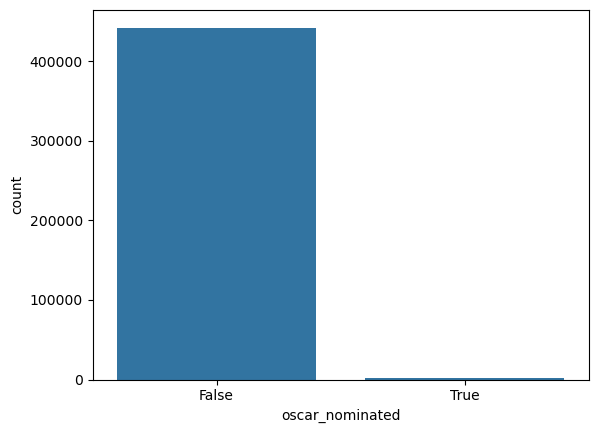

In [198]:
sns.countplot(data=df, x='oscar_nominated')

In [173]:
df.groupby(['oscar_nominated']).agg(count=('oscar_nominated', 'size'))

,count
oscar_nominated,
False,442061
True,1443


The data is very imbalanced. For the training we should make it balanced. We should implement cross-validation but simple 80-20 split will work for now

In [ ]:
# Shuffle the data
exploded_df = exploded_df.sample(frac=1)
exploded_df['oscar_nominated'] = exploded_df['oscar_nominated'].astype(int)

# Upsample the oscar nominated data 
non_oscar_nominated_df = exploded_df[exploded_df['oscar_nominated'] == 0]
oscar_nominated_df = exploded_df[exploded_df['oscar_nominated'] == 1]

oscar_nominated_upsampled_df = resample(oscar_nominated_df, replace=True, n_samples=len(non_oscar_nominated_df))

sampled_df = pd.concat([non_oscar_nominated_df, oscar_nominated_upsampled_df])
sampled_df = sampled_df.sample(frac=1)


sampled_df['languages'] = sampled_df['languages'].apply(lambda x: x.replace(' ', '_'))
sampled_df['genres'] = sampled_df['genres'].apply(lambda x: x.replace(' ', '_'))
sampled_df['countries'] = sampled_df['countries'].apply(lambda x: x.replace(' ', '_'))

one_hot_df = pd.get_dummies(sampled_df, columns=['languages', 'countries', 'genres'])

# Sample data to make training faster
reg_df = one_hot_df.sample(frac=0.01)

# Split the data
train_split = 0.8

train = reg_df[:int(train_split * len(reg_df))]
test = reg_df[int(train_split * len(reg_df)):]

AttributeError: 'float' object has no attribute 'replace'

## Train model

Index(['languages_, ', 'languages_Aboriginal Malay languages',
       'languages_Aceh Language', 'languages_Afrikaans Language',
       'languages_Albanian language', 'languages_Algonquin Language',
       'languages_American English', 'languages_American Sign Language',
       'languages_Amharic Language', 'languages_Ancient Greek',
       ...
       'languages_Ukrainian Language', 'languages_Urdu Language',
       'languages_Venetian Language', 'languages_Vietnamese Language',
       'languages_Welsh Language', 'languages_Wolof Language',
       'languages_Xhosa Language', 'languages_Yiddish Language',
       'languages_Yolngu Matha', 'languages_Zulu Language'],
      dtype='object', length=181)

In [233]:
# Build string
continuous_features_str = ' + '.join(continuous_features)
categorical_features_str = ' + '.join([f'C({feature})' for feature in categorical_features])

categorical_columns_encoded = reg_df.columns[train.columns.str.contains('languages') | train.columns.str.contains('countries') | train.columns.str.contains('genres')]

categorical_features_str = categorical_features_str + ' + ' + ' + '.join(categorical_columns_encoded)
formula = f'oscar_nominated ~ {continuous_features_str} + {categorical_features_str}'

# Fit the model
mod = smf.logit(formula=formula, data=train)
res = mod.fit(method='bfgs')

SyntaxError: invalid syntax (<unknown>, line 1)

## Evaluate the model

### Predict on test

In [216]:
output = res.predict(test)
pred = output > 0.5

PatsyError: predict requires that you use a DataFrame when predicting from a model
that was created using the formula api.

The original error message returned by patsy is:
Error converting data to categorical: observation with value 'Lithuanian language' does not match any of the expected levels (expected: [', ', 'Aboriginal Malay languages', ..., 'Yiddish Language', 'Zulu Language'])
    oscar_nominated ~ box_office_revenue + runtime + year + actor_age + average_rating + number_of_votes + C(languages) + C(countries) + C(genres) + C(actor_gender) + C(actor_ethnicity) + C(has_rating)
                                                                                                           ^^^^^^^^^^^^

### Caclulate accuracy on test

In [ ]:
(pred == test['oscar_nominated']).mean()

### Calculate F1 score on test

In [ ]:
f1_score(test['oscar_nominated'], pred)

### Generate confusion matrx

In [ ]:
confusion_matrix(test['oscar_nominated'], pred)

### Plot weights